In [ ]:
# calculating Catch Per Unit Effort (CPUE)

Formula to be Used:
CPUE
=
Total Catch
Number of Gillnet Sets
CPUE= 
Number of Gillnet Sets
Total Catch
​


In [4]:
# Formula : CPUE= Total Catch / Number of gillnet sets 

# The number of times gillnet set is equal to the column [Date of Fishing] and the Total Catch is equal either by the column of [Total Number] and [Total Weight (kg)] in the dataset 

# Calculation of the CPUE according to the formula for Total Catch and separately for using [Total Number] and separately for [Total Weight (kg)] for CCTV and Shellcatch

In [3]:
import pandas as pd

# Load the Excel file from the specified path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Function to calculate CPUE based on the number of gillnet sets
def calculate_cpue_by_gillnet_sets(df, total_catch_column):
    total_catch = df[total_catch_column].sum()
    total_effort = df['Date of Fishing'].nunique()  # Assuming each unique date represents one gillnet set
    cpue = total_catch / total_effort if total_effort != 0 else 0
    return cpue

# Function to calculate CPUE based on the total length of gillnet
def calculate_cpue_by_length_of_gillnet(df, total_catch_column):
    total_catch = df[total_catch_column].sum()
    total_length = df['Length of Net (km)'].sum()
    cpue = total_catch / total_length if total_length != 0 else 0
    return cpue

# Function to calculate CPUE based on the total time gillnets are in the water
def calculate_cpue_by_total_time(df, total_catch_column, time_column):
    total_catch = df[total_catch_column].sum()
    total_time = df[time_column].sum()
    cpue = total_catch / total_time if total_time != 0 else 0
    return cpue

# Split the dataset into CCTV and Shellcatch
cctv_data = df[df['EMS'] == 'CCTV']
shellcatch_data = df[df['EMS'] == 'Shellcatch']

# Calculate CPUE for CCTV
cpue_cctv_number_weight = calculate_cpue_by_gillnet_sets(cctv_data, 'Total Weight (kg)')
cpue_cctv_number_count = calculate_cpue_by_gillnet_sets(cctv_data, 'Total Number')
cpue_cctv_length_weight = calculate_cpue_by_length_of_gillnet(cctv_data, 'Total Weight (kg)')
cpue_cctv_length_count = calculate_cpue_by_length_of_gillnet(cctv_data, 'Total Number')
cpue_cctv_time_weight_hours = calculate_cpue_by_total_time(cctv_data, 'Total Weight (kg)', 'Soak Time')
cpue_cctv_time_count_hours = calculate_cpue_by_total_time(cctv_data, 'Total Number', 'Soak Time')

# Calculate CPUE for Shellcatch
cpue_shellcatch_number_weight = calculate_cpue_by_gillnet_sets(shellcatch_data, 'Total Weight (kg)')
cpue_shellcatch_number_count = calculate_cpue_by_gillnet_sets(shellcatch_data, 'Total Number')
cpue_shellcatch_length_weight = calculate_cpue_by_length_of_gillnet(shellcatch_data, 'Total Weight (kg)')
cpue_shellcatch_length_count = calculate_cpue_by_length_of_gillnet(shellcatch_data, 'Total Number')
cpue_shellcatch_time_weight_hours = calculate_cpue_by_total_time(shellcatch_data, 'Total Weight (kg)', 'Soak Time')
cpue_shellcatch_time_count_hours = calculate_cpue_by_total_time(shellcatch_data, 'Total Number', 'Soak Time')

# For days calculation, assuming 'Date of Fishing' to 'Date of Arrival Port' represents total days
cctv_data['Fishing Days'] = (pd.to_datetime(cctv_data['Date of Arrival Port']) - pd.to_datetime(cctv_data['Date of Fishing'])).dt.days
shellcatch_data['Fishing Days'] = (pd.to_datetime(shellcatch_data['Date of Arrival Port']) - pd.to_datetime(shellcatch_data['Date of Fishing'])).dt.days

cpue_cctv_time_weight_days = calculate_cpue_by_total_time(cctv_data, 'Total Weight (kg)', 'Fishing Days')
cpue_cctv_time_count_days = calculate_cpue_by_total_time(cctv_data, 'Total Number', 'Fishing Days')
cpue_shellcatch_time_weight_days = calculate_cpue_by_total_time(shellcatch_data, 'Total Weight (kg)', 'Fishing Days')
cpue_shellcatch_time_count_days = calculate_cpue_by_total_time(shellcatch_data, 'Total Number', 'Fishing Days')

# Print results
print("CCTV CPUE Calculations:")
print(f"CPUE (Total Weight by Number of Sets): {cpue_cctv_number_weight} kg/set")
print(f"CPUE (Total Number by Number of Sets): {cpue_cctv_number_count} fish/set")
print(f"CPUE (Total Weight by Length): {cpue_cctv_length_weight} kg/km")
print(f"CPUE (Total Number by Length): {cpue_cctv_length_count} fish/km")
print(f"CPUE (Total Weight by Soak Time): {cpue_cctv_time_weight_hours} kg/hour")
print(f"CPUE (Total Number by Soak Time): {cpue_cctv_time_count_hours} fish/hour")
print(f"CPUE (Total Weight by Fishing Days): {cpue_cctv_time_weight_days} kg/day")
print(f"CPUE (Total Number by Fishing Days): {cpue_cctv_time_count_days} fish/day")

print("\nShellcatch CPUE Calculations:")
print(f"CPUE (Total Weight by Number of Sets): {cpue_shellcatch_number_weight} kg/set")
print(f"CPUE (Total Number by Number of Sets): {cpue_shellcatch_number_count} fish/set")
print(f"CPUE (Total Weight by Length): {cpue_shellcatch_length_weight} kg/km")
print(f"CPUE (Total Number by Length): {cpue_shellcatch_length_count} fish/km")
print(f"CPUE (Total Weight by Soak Time): {cpue_shellcatch_time_weight_hours} kg/hour")
print(f"CPUE (Total Number by Soak Time): {cpue_shellcatch_time_count_hours} fish/hour")
print(f"CPUE (Total Weight by Fishing Days): {cpue_shellcatch_time_weight_days} kg/day")
print(f"CPUE (Total Number by Fishing Days): {cpue_shellcatch_time_count_days} fish/day")


CCTV CPUE Calculations:
CPUE (Total Weight by Number of Sets): 370.44444444444446 kg/set
CPUE (Total Number by Number of Sets): 126.61111111111111 fish/set
CPUE (Total Weight by Length): 6.0398550724637685 kg/km
CPUE (Total Number by Length): 2.0643115942028984 fish/km
CPUE (Total Weight by Soak Time): 6.106227106227106 kg/hour
CPUE (Total Number by Soak Time): 2.086996336996337 fish/hour
CPUE (Total Weight by Fishing Days): 7.89112426035503 kg/day
CPUE (Total Number by Fishing Days): 2.6970414201183432 fish/day

Shellcatch CPUE Calculations:
CPUE (Total Weight by Number of Sets): 237.1851851851852 kg/set
CPUE (Total Number by Number of Sets): 116.74074074074075 fish/set
CPUE (Total Weight by Length): 4.941358024691358 kg/km
CPUE (Total Number by Length): 2.432098765432099 fish/km
CPUE (Total Weight by Soak Time): 4.941358024691358 kg/hour
CPUE (Total Number by Soak Time): 2.432098765432099 fish/hour
CPUE (Total Weight by Fishing Days): 1.430422157694885 kg/day
CPUE (Total Number by Fi

C:\Users\Shoaib\AppData\Local\Temp\ipykernel_18836\2336084508.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cctv_data['Fishing Days'] = (pd.to_datetime(cctv_data['Date of Arrival Port']) - pd.to_datetime(cctv_data['Date of Fishing'])).dt.days
C:\Users\Shoaib\AppData\Local\Temp\ipykernel_18836\2336084508.py:50: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  shellcatch_data['Fishing Days'] = (pd.to_datetime(shellcatch_data['Date of Arrival Port']) - pd.to_datetime(shellcatch_data['Date of Fishing'])).dt

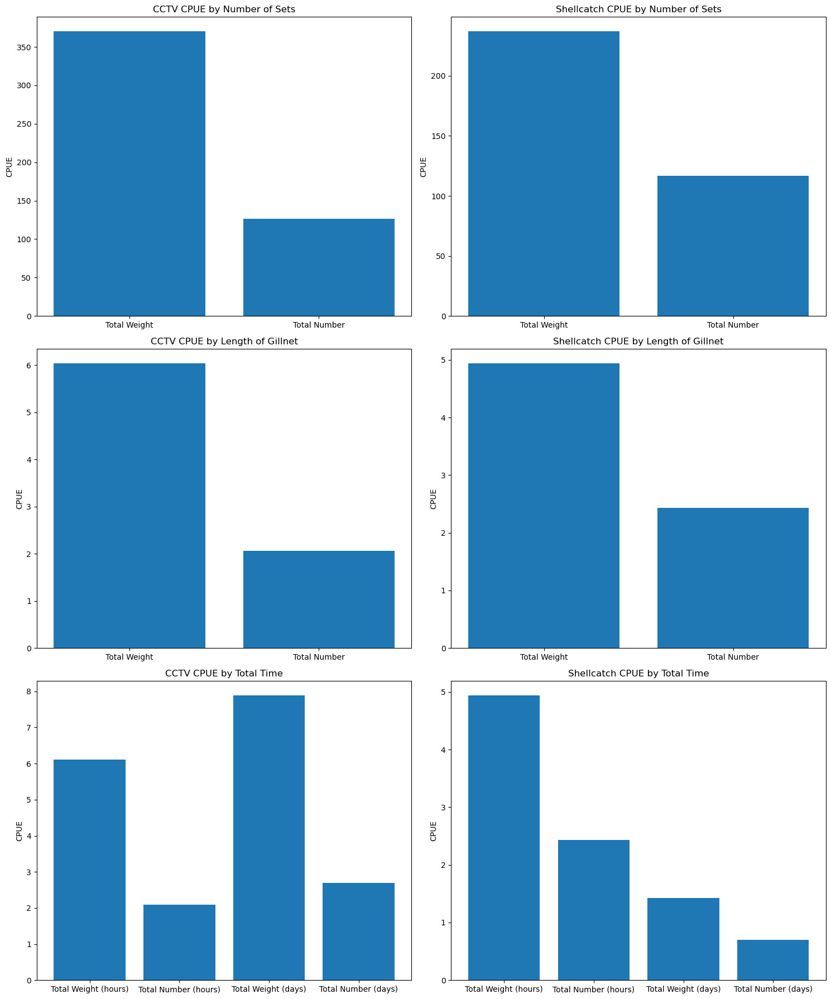

In [154]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the Excel file from the specified path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Function to calculate CPUE based on the number of gillnet sets
def calculate_cpue_by_gillnet_sets(df, total_catch_column):
    total_catch = df[total_catch_column].sum()
    total_effort = df['Date of Fishing'].nunique()  # Assuming each unique date represents one gillnet set
    cpue = total_catch / total_effort if total_effort != 0 else 0
    return cpue

# Function to calculate CPUE based on the total length of gillnet
def calculate_cpue_by_length_of_gillnet(df, total_catch_column):
    total_catch = df[total_catch_column].sum()
    total_length = df['Length of Net (km)'].sum()
    cpue = total_catch / total_length if total_length != 0 else 0
    return cpue

# Function to calculate CPUE based on the total time gillnets are in the water
def calculate_cpue_by_total_time(df, total_catch_column, time_column):
    total_catch = df[total_catch_column].sum()
    total_time = df[time_column].sum()
    cpue = total_catch / total_time if total_time != 0 else 0
    return cpue

# Split the dataset into CCTV and Shellcatch
cctv_data = df[df['EMS'] == 'CCTV']
shellcatch_data = df[df['EMS'] == 'Shellcatch']

# Calculate CPUE for CCTV
cpue_cctv_number_weight = calculate_cpue_by_gillnet_sets(cctv_data, 'Total Weight (kg)')
cpue_cctv_number_count = calculate_cpue_by_gillnet_sets(cctv_data, 'Total Number')
cpue_cctv_length_weight = calculate_cpue_by_length_of_gillnet(cctv_data, 'Total Weight (kg)')
cpue_cctv_length_count = calculate_cpue_by_length_of_gillnet(cctv_data, 'Total Number')
cpue_cctv_time_weight_hours = calculate_cpue_by_total_time(cctv_data, 'Total Weight (kg)', 'Soak Time')
cpue_cctv_time_count_hours = calculate_cpue_by_total_time(cctv_data, 'Total Number', 'Soak Time')

# Calculate CPUE for Shellcatch
cpue_shellcatch_number_weight = calculate_cpue_by_gillnet_sets(shellcatch_data, 'Total Weight (kg)')
cpue_shellcatch_number_count = calculate_cpue_by_gillnet_sets(shellcatch_data, 'Total Number')
cpue_shellcatch_length_weight = calculate_cpue_by_length_of_gillnet(shellcatch_data, 'Total Weight (kg)')
cpue_shellcatch_length_count = calculate_cpue_by_length_of_gillnet(shellcatch_data, 'Total Number')
cpue_shellcatch_time_weight_hours = calculate_cpue_by_total_time(shellcatch_data, 'Total Weight (kg)', 'Soak Time')
cpue_shellcatch_time_count_hours = calculate_cpue_by_total_time(shellcatch_data, 'Total Number', 'Soak Time')

# For days calculation, assuming 'Date of Fishing' to 'Date of Arrival Port' represents total days
cctv_data['Fishing Days'] = (pd.to_datetime(cctv_data['Date of Arrival Port']) - pd.to_datetime(cctv_data['Date of Fishing'])).dt.days
shellcatch_data['Fishing Days'] = (pd.to_datetime(shellcatch_data['Date of Arrival Port']) - pd.to_datetime(shellcatch_data['Date of Fishing'])).dt.days

cpue_cctv_time_weight_days = calculate_cpue_by_total_time(cctv_data, 'Total Weight (kg)', 'Fishing Days')
cpue_cctv_time_count_days = calculate_cpue_by_total_time(cctv_data, 'Total Number', 'Fishing Days')
cpue_shellcatch_time_weight_days = calculate_cpue_by_total_time(shellcatch_data, 'Total Weight (kg)', 'Fishing Days')
cpue_shellcatch_time_count_days = calculate_cpue_by_total_time(shellcatch_data, 'Total Number', 'Fishing Days')

# Plot results
fig, axes = plt.subplots(3, 2, figsize=(15, 18))

# CCTV Plots
axes[0, 0].bar(['Total Weight', 'Total Number'], [cpue_cctv_number_weight, cpue_cctv_number_count])
axes[0, 0].set_title('CCTV CPUE by Number of Sets')
axes[0, 0].set_ylabel('CPUE')

axes[1, 0].bar(['Total Weight', 'Total Number'], [cpue_cctv_length_weight, cpue_cctv_length_count])
axes[1, 0].set_title('CCTV CPUE by Length of Gillnet')
axes[1, 0].set_ylabel('CPUE')

axes[2, 0].bar(['Total Weight (hours)', 'Total Number (hours)', 'Total Weight (days)', 'Total Number (days)'],
               [cpue_cctv_time_weight_hours, cpue_cctv_time_count_hours, cpue_cctv_time_weight_days, cpue_cctv_time_count_days])
axes[2, 0].set_title('CCTV CPUE by Total Time')
axes[2, 0].set_ylabel('CPUE')

# Shellcatch Plots
axes[0, 1].bar(['Total Weight', 'Total Number'], [cpue_shellcatch_number_weight, cpue_shellcatch_number_count])
axes[0, 1].set_title('Shellcatch CPUE by Number of Sets')
axes[0, 1].set_ylabel('CPUE')

axes[1, 1].bar(['Total Weight', 'Total Number'], [cpue_shellcatch_length_weight, cpue_shellcatch_length_count])
axes[1, 1].set_title('Shellcatch CPUE by Length of Gillnet')
axes[1, 1].set_ylabel('CPUE')

axes[2, 1].bar(['Total Weight (hours)', 'Total Number (hours)', 'Total Weight (days)', 'Total Number (days)'],
               [cpue_shellcatch_time_weight_hours, cpue_shellcatch_time_count_hours, cpue_shellcatch_time_weight_days, cpue_shellcatch_time_count_days])
axes[2, 1].set_title('Shellcatch CPUE by Total Time')
axes[2, 1].set_ylabel('CPUE')

plt.tight_layout()
plt.show()


In [156]:
import pandas as pd

# Load the Excel file from the specified path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Function to calculate CPUE based on the number of gillnet sets
def calculate_cpue_by_gillnet_sets(df, total_catch_column):
    total_catch = df[total_catch_column].sum()
    total_effort = df['Date of Fishing'].nunique()  # Assuming each unique date represents one gillnet set
    cpue = total_catch / total_effort if total_effort != 0 else 0
    return cpue

# Split the dataset into CCTV and Shellcatch
cctv_data = df[df['EMS'] == 'CCTV']
shellcatch_data = df[df['EMS'] == 'Shellcatch']

# Calculate CPUE for CCTV
cpue_cctv_weight = calculate_cpue_by_gillnet_sets(cctv_data, 'Total Weight (kg)')
cpue_cctv_number = calculate_cpue_by_gillnet_sets(cctv_data, 'Total Number')

# Calculate CPUE for Shellcatch
cpue_shellcatch_weight = calculate_cpue_by_gillnet_sets(shellcatch_data, 'Total Weight (kg)')
cpue_shellcatch_number = calculate_cpue_by_gillnet_sets(shellcatch_data, 'Total Number')

# Print results
print("CCTV CPUE Calculations:")
print(f"CPUE (Total Weight): {cpue_cctv_weight} kg/set")
print(f"CPUE (Total Number): {cpue_cctv_number} fish/set")

print("\nShellcatch CPUE Calculations:")
print(f"CPUE (Total Weight): {cpue_shellcatch_weight} kg/set")
print(f"CPUE (Total Number): {cpue_shellcatch_number} fish/set")


CCTV CPUE Calculations:
CPUE (Total Weight): 370.44444444444446 kg/set
CPUE (Total Number): 126.61111111111111 fish/set

Shellcatch CPUE Calculations:
CPUE (Total Weight): 237.1851851851852 kg/set
CPUE (Total Number): 116.74074074074075 fish/set


Verification:
The function calculate_cpue_by_gillnet_sets correctly calculates the CPUE using the formula:
CPUE
=
Total Catch
Number of Gillnet Sets
CPUE= 
Number of Gillnet Sets
Total Catch
​
 

Total Catch is derived from the sum of the specified column (Total Weight (kg) or Total Number).
Number of Gillnet Sets is calculated by counting the unique dates in the Date of Fishing column, assuming each unique date represents one gillnet set.

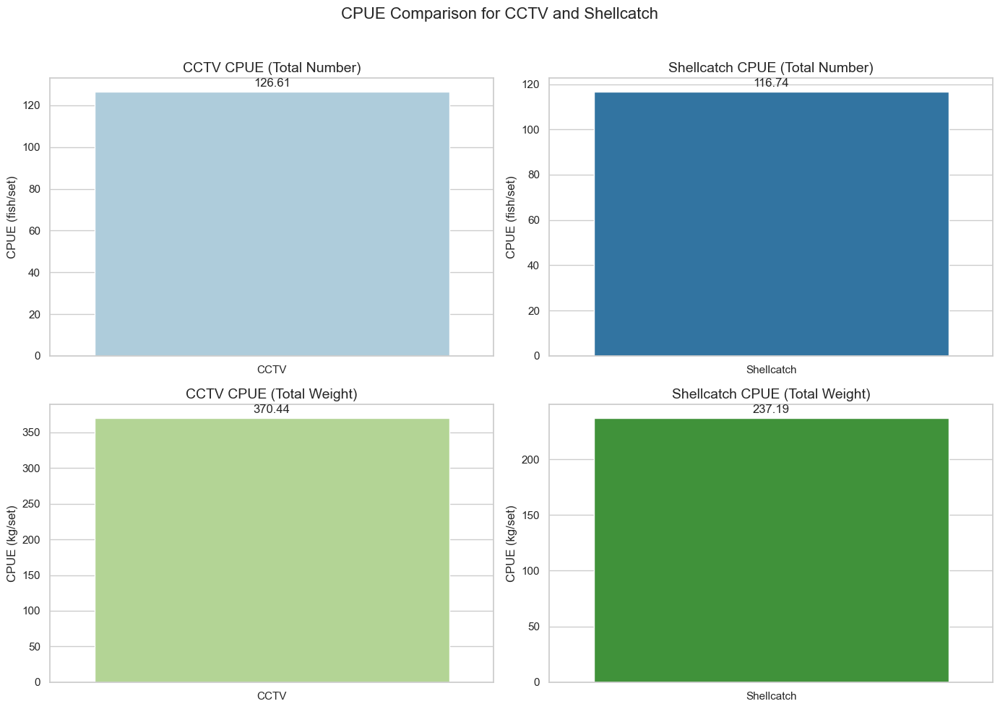

In [161]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel file from the specified path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Function to calculate CPUE based on the number of gillnet sets
def calculate_cpue_by_gillnet_sets(df, total_catch_column):
    total_catch = df[total_catch_column].sum()
    total_effort = df['Date of Fishing'].nunique()  # Assuming each unique date represents one gillnet set
    cpue = total_catch / total_effort if total_effort != 0 else 0
    return cpue

# Split the dataset into CCTV and Shellcatch
cctv_data = df[df['EMS'] == 'CCTV']
shellcatch_data = df[df['EMS'] == 'Shellcatch']

# Calculate CPUE for CCTV
cpue_cctv_weight = calculate_cpue_by_gillnet_sets(cctv_data, 'Total Weight (kg)')
cpue_cctv_number = calculate_cpue_by_gillnet_sets(cctv_data, 'Total Number')

# Calculate CPUE for Shellcatch
cpue_shellcatch_weight = calculate_cpue_by_gillnet_sets(shellcatch_data, 'Total Weight (kg)')
cpue_shellcatch_number = calculate_cpue_by_gillnet_sets(shellcatch_data, 'Total Number')

# Set the style and color palette for the plots
sns.set(style="whitegrid")
palette = sns.color_palette("Paired")

# Create a figure and axis objects
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('CPUE Comparison for CCTV and Shellcatch', fontsize=16)

# Plot CCTV Total Number
sns.barplot(ax=axes[0, 0], x=['CCTV'], y=[cpue_cctv_number], palette=[palette[0]])
axes[0, 0].set_title('CCTV CPUE (Total Number)', fontsize=14)
axes[0, 0].set_ylabel('CPUE (fish/set)', fontsize=12)
axes[0, 0].bar_label(axes[0, 0].containers[0], fmt='%.2f', padding=3)

# Plot Shellcatch Total Number
sns.barplot(ax=axes[0, 1], x=['Shellcatch'], y=[cpue_shellcatch_number], palette=[palette[1]])
axes[0, 1].set_title('Shellcatch CPUE (Total Number)', fontsize=14)
axes[0, 1].set_ylabel('CPUE (fish/set)', fontsize=12)
axes[0, 1].bar_label(axes[0, 1].containers[0], fmt='%.2f', padding=3)

# Plot CCTV Total Weight
sns.barplot(ax=axes[1, 0], x=['CCTV'], y=[cpue_cctv_weight], palette=[palette[2]])
axes[1, 0].set_title('CCTV CPUE (Total Weight)', fontsize=14)
axes[1, 0].set_ylabel('CPUE (kg/set)', fontsize=12)
axes[1, 0].bar_label(axes[1, 0].containers[0], fmt='%.2f', padding=3)

# Plot Shellcatch Total Weight
sns.barplot(ax=axes[1, 1], x=['Shellcatch'], y=[cpue_shellcatch_weight], palette=[palette[3]])
axes[1, 1].set_title('Shellcatch CPUE (Total Weight)', fontsize=14)
axes[1, 1].set_ylabel('CPUE (kg/set)', fontsize=12)
axes[1, 1].bar_label(axes[1, 1].containers[0], fmt='%.2f', padding=3)

# Adjust layout and show the plot
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


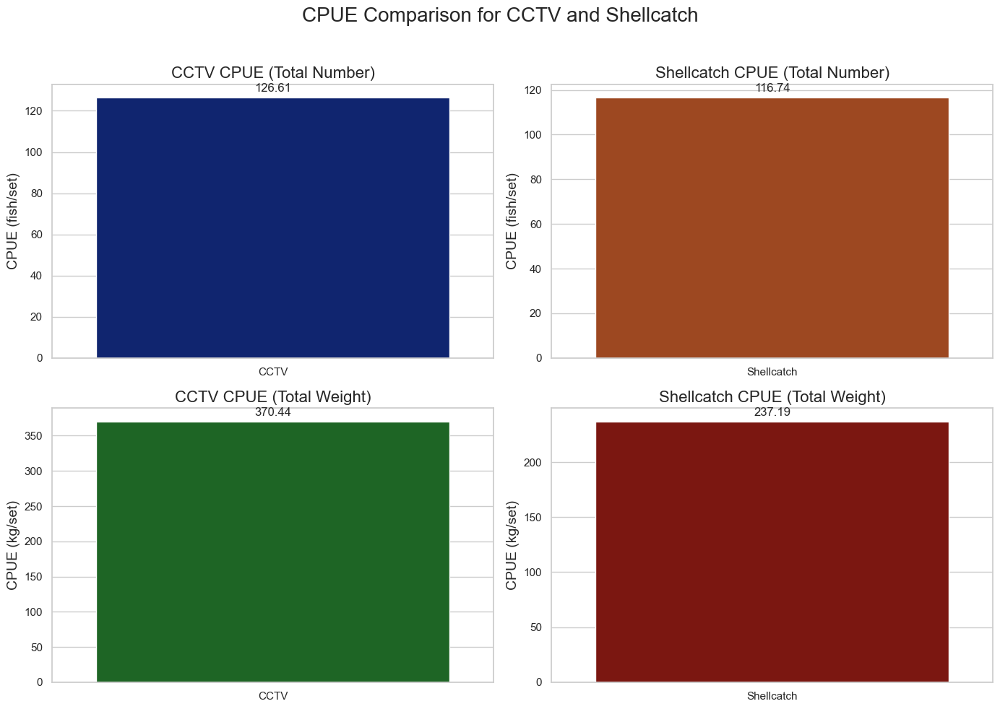

In [162]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel file from the specified path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Function to calculate CPUE based on the number of gillnet sets
def calculate_cpue_by_gillnet_sets(df, total_catch_column):
    total_catch = df[total_catch_column].sum()
    total_effort = df['Date of Fishing'].nunique()  # Assuming each unique date represents one gillnet set
    cpue = total_catch / total_effort if total_effort != 0 else 0
    return cpue

# Split the dataset into CCTV and Shellcatch
cctv_data = df[df['EMS'] == 'CCTV']
shellcatch_data = df[df['EMS'] == 'Shellcatch']

# Calculate CPUE for CCTV
cpue_cctv_weight = calculate_cpue_by_gillnet_sets(cctv_data, 'Total Weight (kg)')
cpue_cctv_number = calculate_cpue_by_gillnet_sets(cctv_data, 'Total Number')

# Calculate CPUE for Shellcatch
cpue_shellcatch_weight = calculate_cpue_by_gillnet_sets(shellcatch_data, 'Total Weight (kg)')
cpue_shellcatch_number = calculate_cpue_by_gillnet_sets(shellcatch_data, 'Total Number')

# Set the style and color palette for the plots
sns.set(style="whitegrid")
palette = sns.color_palette("dark")

# Create a figure and axis objects
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('CPUE Comparison for CCTV and Shellcatch', fontsize=20)

# Plot CCTV Total Number
sns.barplot(ax=axes[0, 0], x=['CCTV'], y=[cpue_cctv_number], palette=[palette[0]])
axes[0, 0].set_title('CCTV CPUE (Total Number)', fontsize=16)
axes[0, 0].set_ylabel('CPUE (fish/set)', fontsize=14)
axes[0, 0].set_xlabel('')
axes[0, 0].bar_label(axes[0, 0].containers[0], fmt='%.2f', padding=3)

# Plot Shellcatch Total Number
sns.barplot(ax=axes[0, 1], x=['Shellcatch'], y=[cpue_shellcatch_number], palette=[palette[1]])
axes[0, 1].set_title('Shellcatch CPUE (Total Number)', fontsize=16)
axes[0, 1].set_ylabel('CPUE (fish/set)', fontsize=14)
axes[0, 1].set_xlabel('')
axes[0, 1].bar_label(axes[0, 1].containers[0], fmt='%.2f', padding=3)

# Plot CCTV Total Weight
sns.barplot(ax=axes[1, 0], x=['CCTV'], y=[cpue_cctv_weight], palette=[palette[2]])
axes[1, 0].set_title('CCTV CPUE (Total Weight)', fontsize=16)
axes[1, 0].set_ylabel('CPUE (kg/set)', fontsize=14)
axes[1, 0].set_xlabel('')
axes[1, 0].bar_label(axes[1, 0].containers[0], fmt='%.2f', padding=3)

# Plot Shellcatch Total Weight
sns.barplot(ax=axes[1, 1], x=['Shellcatch'], y=[cpue_shellcatch_weight], palette=[palette[3]])
axes[1, 1].set_title('Shellcatch CPUE (Total Weight)', fontsize=16)
axes[1, 1].set_ylabel('CPUE (kg/set)', fontsize=14)
axes[1, 1].set_xlabel('')
axes[1, 1].bar_label(axes[1, 1].containers[0], fmt='%.2f', padding=3)

# Adjust layout and show the plot
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


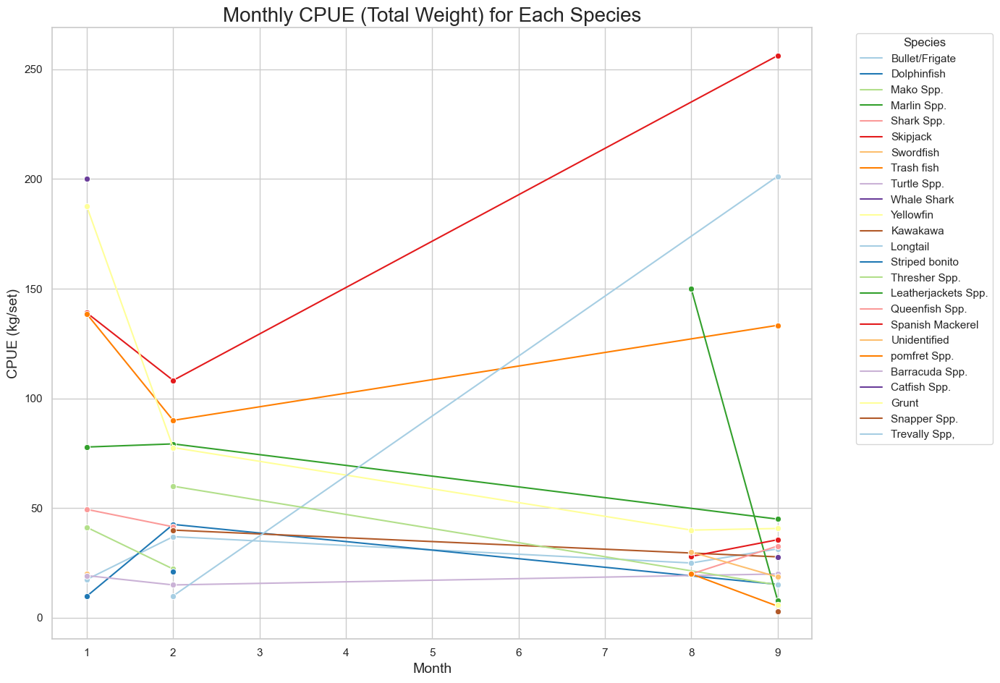

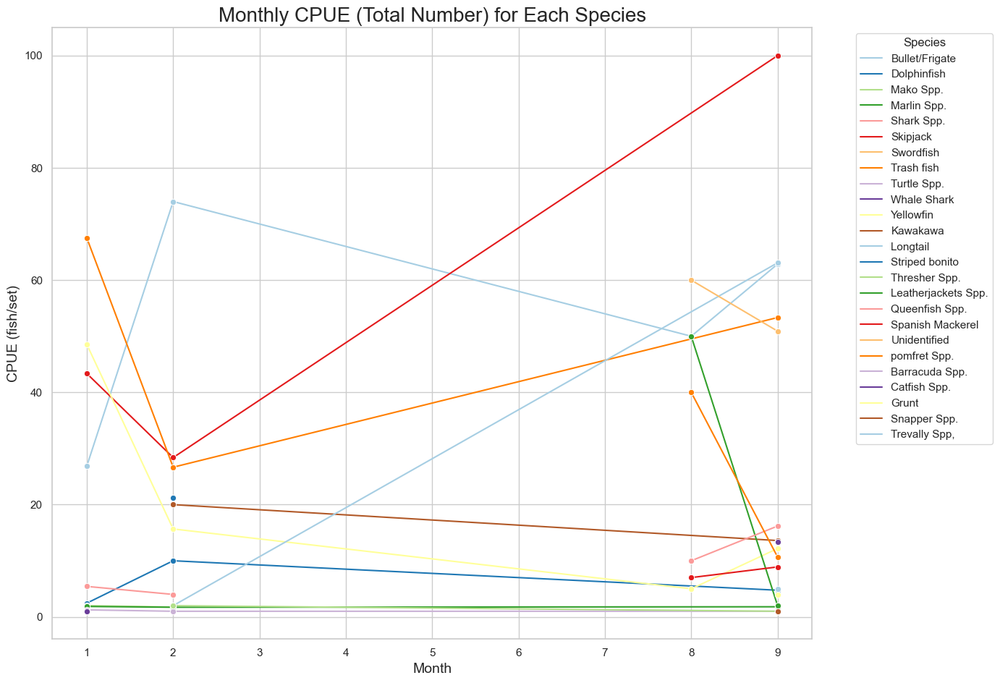

In [164]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel file from the specified path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'])

# Extract month from 'Date of Fishing'
df['Month'] = df['Date of Fishing'].dt.month

# Function to calculate CPUE by month and species
def calculate_cpue_by_month(df, total_catch_column):
    cpue_by_month = df.groupby(['Month', 'Spp.']).apply(lambda x: x[total_catch_column].sum() / x['Date of Fishing'].nunique() if x['Date of Fishing'].nunique() != 0 else 0)
    cpue_by_month = cpue_by_month.reset_index(name='CPUE')
    return cpue_by_month

# Calculate CPUE for each species by month for both Total Weight (kg) and Total Number
cpue_weight_by_month = calculate_cpue_by_month(df, 'Total Weight (kg)')
cpue_number_by_month = calculate_cpue_by_month(df, 'Total Number')

# Plotting the CPUE values for Total Weight by month
plt.figure(figsize=(14, 10))
sns.lineplot(data=cpue_weight_by_month, x='Month', y='CPUE', hue='Spp.', marker='o', palette='Paired')
plt.title('Monthly CPUE (Total Weight) for Each Species', fontsize=20)
plt.xlabel('Month', fontsize=14)
plt.ylabel('CPUE (kg/set)', fontsize=14)
plt.legend(title='Species', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Plotting the CPUE values for Total Number by month
plt.figure(figsize=(14, 10))
sns.lineplot(data=cpue_number_by_month, x='Month', y='CPUE', hue='Spp.', marker='o', palette='Paired')
plt.title('Monthly CPUE (Total Number) for Each Species', fontsize=20)
plt.xlabel('Month', fontsize=14)
plt.ylabel('CPUE (fish/set)', fontsize=14)
plt.legend(title='Species', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


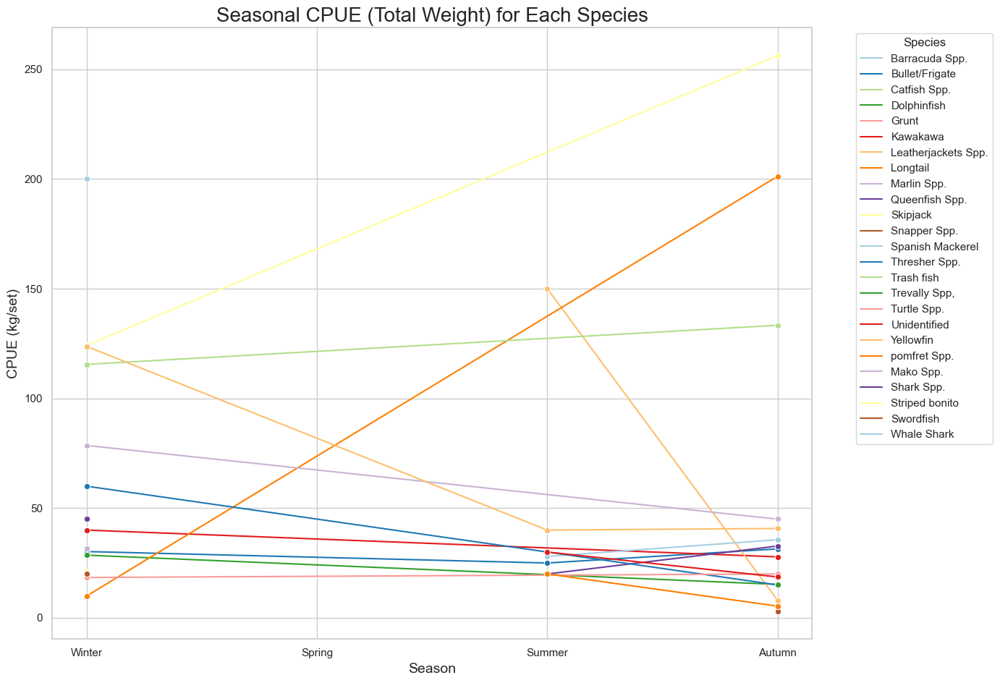

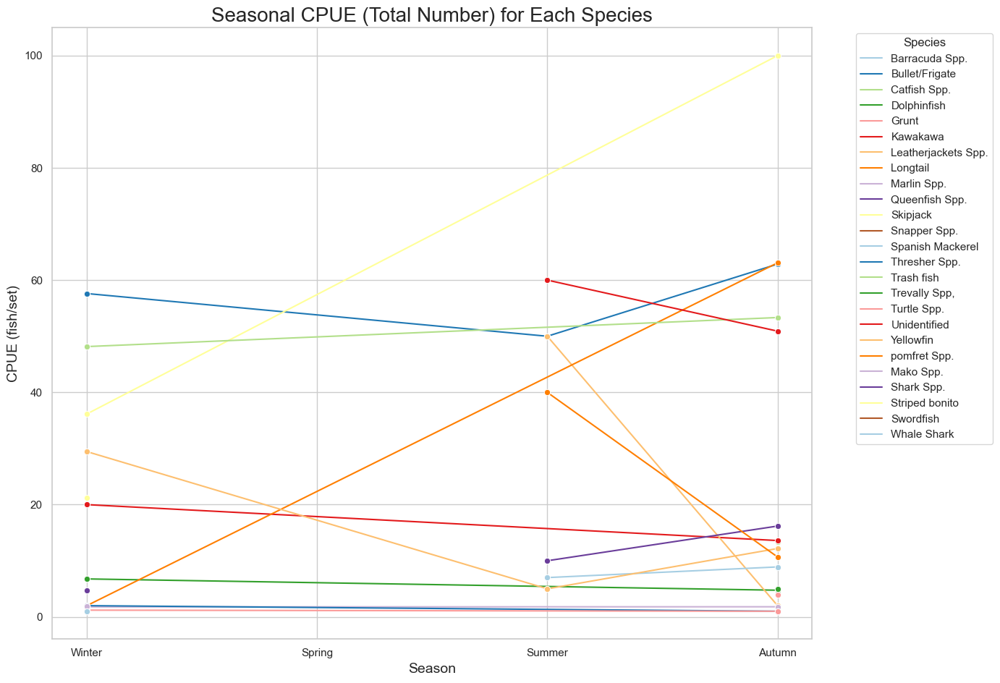

In [166]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel file from the specified path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Convert 'Date of Fishing' to datetime
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'])

# Define seasons
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

# Extract season from 'Date of Fishing'
df['Season'] = df['Date of Fishing'].dt.month.apply(get_season)

# Function to calculate CPUE by season and species
def calculate_cpue_by_season(df, total_catch_column):
    cpue_by_season = df.groupby(['Season', 'Spp.']).apply(lambda x: x[total_catch_column].sum() / x['Date of Fishing'].nunique() if x['Date of Fishing'].nunique() != 0 else 0)
    cpue_by_season = cpue_by_season.reset_index(name='CPUE')
    return cpue_by_season

# Calculate CPUE for each species by season for both Total Weight (kg) and Total Number
cpue_weight_by_season = calculate_cpue_by_season(df, 'Total Weight (kg)')
cpue_number_by_season = calculate_cpue_by_season(df, 'Total Number')

# Order the seasons for plotting
season_order = ['Winter', 'Spring', 'Summer', 'Autumn']
cpue_weight_by_season['Season'] = pd.Categorical(cpue_weight_by_season['Season'], categories=season_order, ordered=True)
cpue_number_by_season['Season'] = pd.Categorical(cpue_number_by_season['Season'], categories=season_order, ordered=True)

# Plotting the CPUE values for Total Weight by season
plt.figure(figsize=(14, 10))
sns.lineplot(data=cpue_weight_by_season, x='Season', y='CPUE', hue='Spp.', marker='o', palette='Paired')
plt.title('Seasonal CPUE (Total Weight) for Each Species', fontsize=20)
plt.xlabel('Season', fontsize=14)
plt.ylabel('CPUE (kg/set)', fontsize=14)
plt.legend(title='Species', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Plotting the CPUE values for Total Number by season
plt.figure(figsize=(14, 10))
sns.lineplot(data=cpue_number_by_season, x='Season', y='CPUE', hue='Spp.', marker='o', palette='Paired')
plt.title('Seasonal CPUE (Total Number) for Each Species', fontsize=20)
plt.xlabel('Season', fontsize=14)
plt.ylabel('CPUE (fish/set)', fontsize=14)
plt.legend(title='Species', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


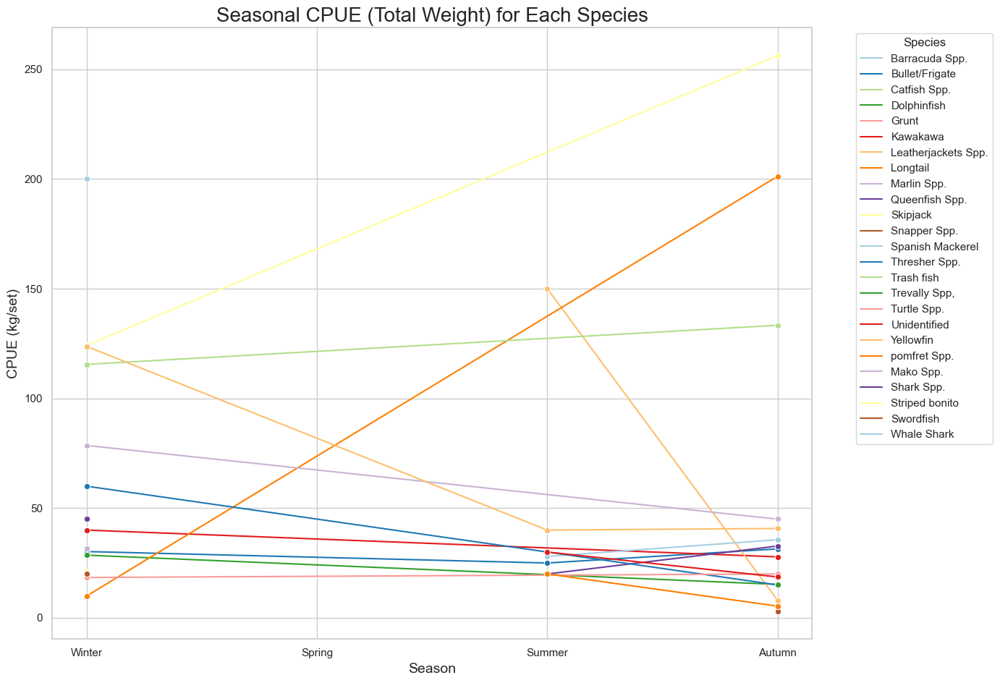

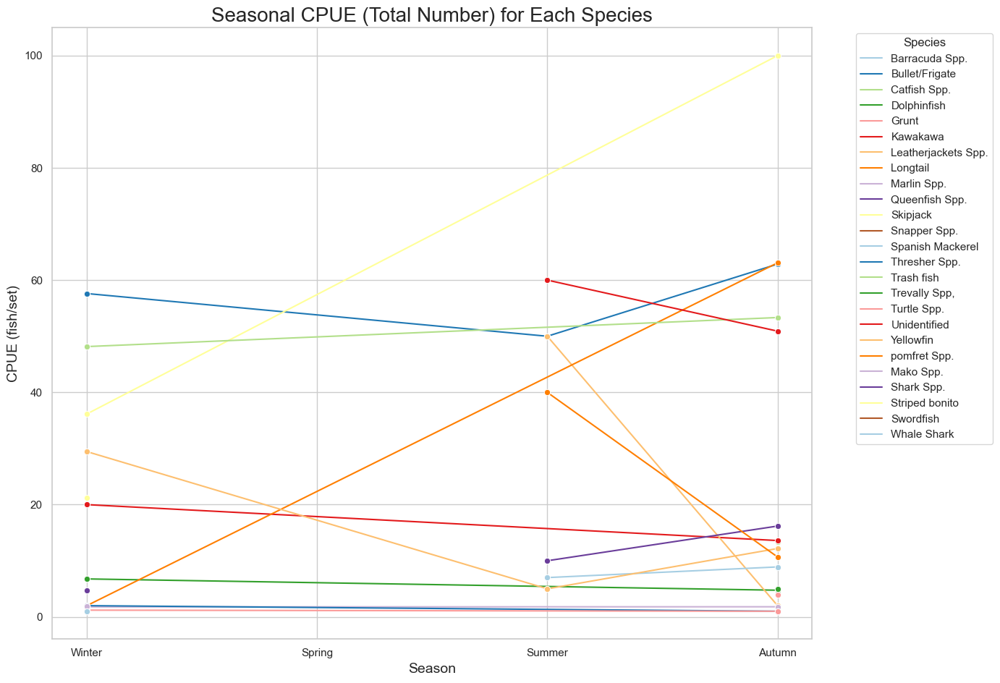

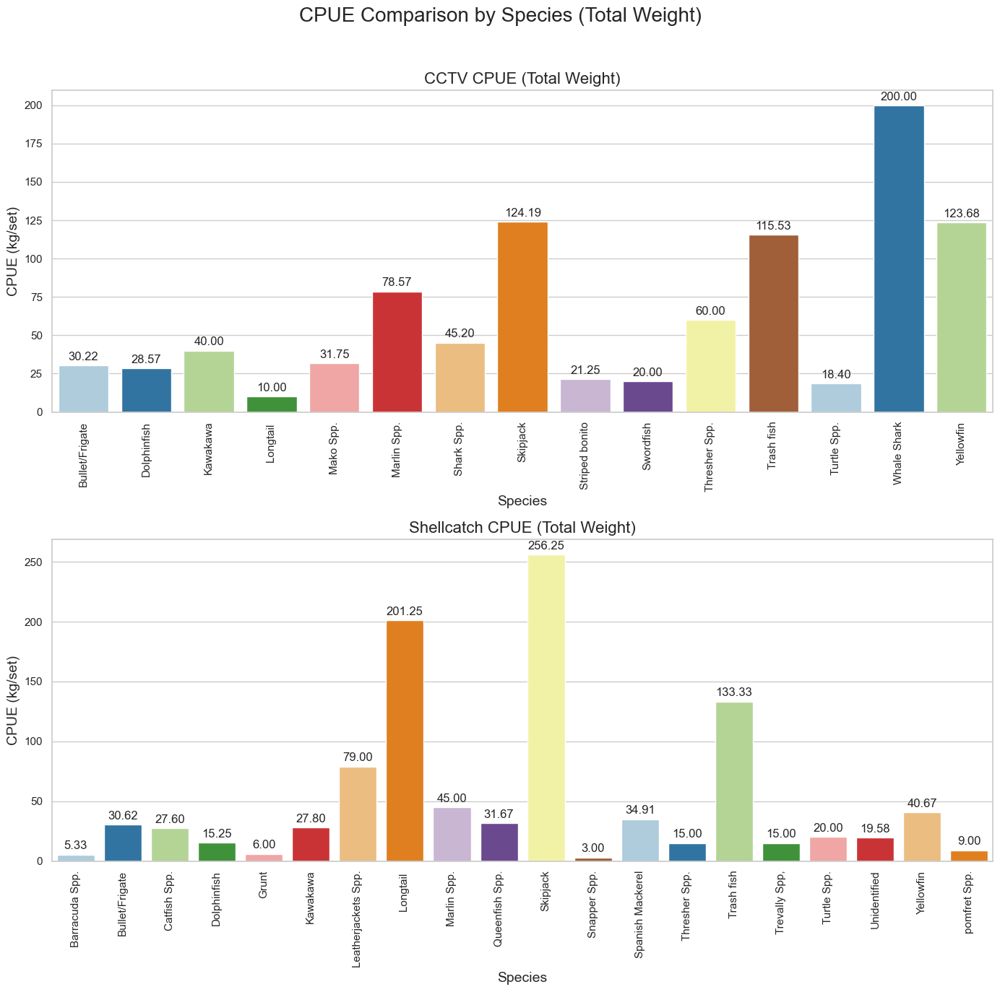

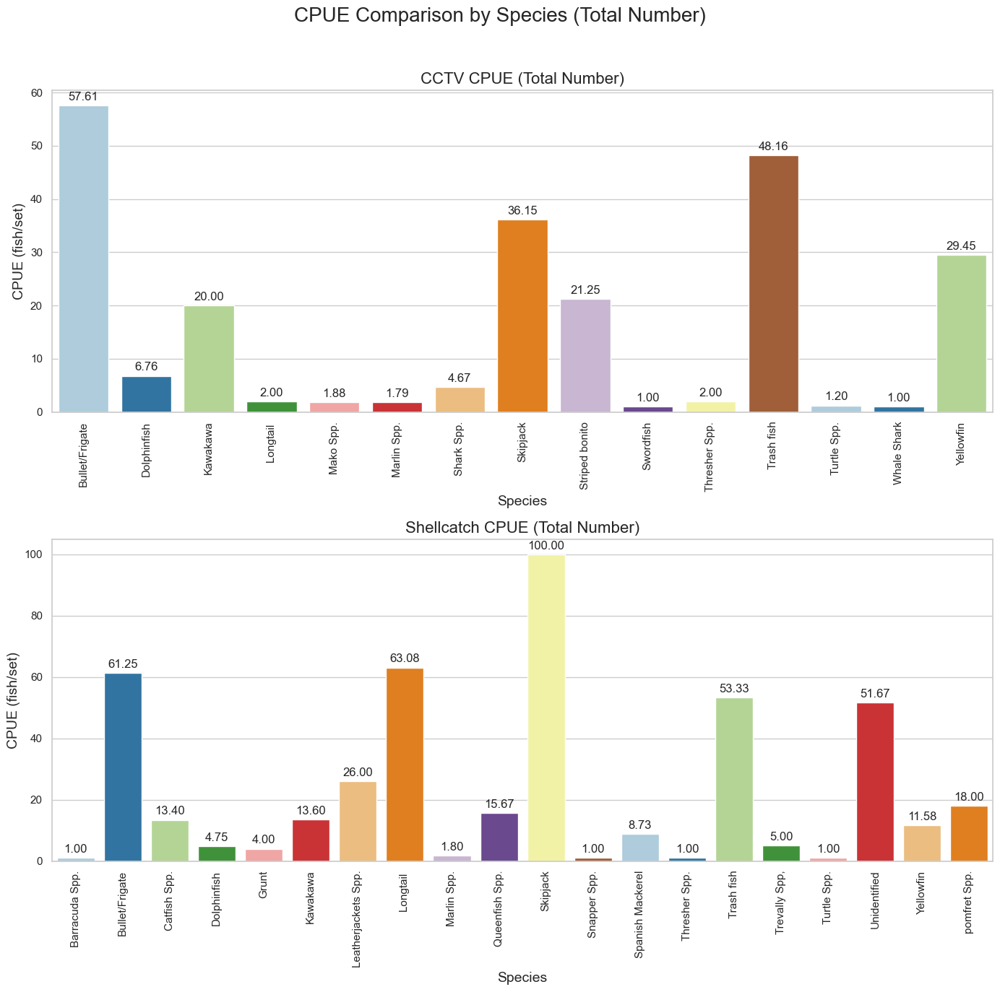

In [167]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel file from the specified path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Function to calculate CPUE based on the number of gillnet sets for each species
def calculate_cpue_by_species(df, total_catch_column):
    cpue_by_species = df.groupby('Spp.').apply(lambda x: x[total_catch_column].sum() / x['Date of Fishing'].nunique() if x['Date of Fishing'].nunique() != 0 else 0)
    cpue_by_species = cpue_by_species.reset_index(name='CPUE')
    return cpue_by_species

# Split the dataset into CCTV and Shellcatch
cctv_data = df[df['EMS'] == 'CCTV']
shellcatch_data = df[df['EMS'] == 'Shellcatch']

# Calculate CPUE for each species for CCTV and Shellcatch
cctv_cpue_weight = calculate_cpue_by_species(cctv_data, 'Total Weight (kg)')
cctv_cpue_number = calculate_cpue_by_species(cctv_data, 'Total Number')

shellcatch_cpue_weight = calculate_cpue_by_species(shellcatch_data, 'Total Weight (kg)')
shellcatch_cpue_number = calculate_cpue_by_species(shellcatch_data, 'Total Number')

# Set the style and color palette for the plots
sns.set(style="whitegrid")
palette = sns.color_palette("dark")

# Plotting the CPUE values for Total Weight for each species
fig, axes = plt.subplots(2, 1, figsize=(14, 14))
fig.suptitle('CPUE Comparison by Species (Total Weight)', fontsize=20)

# Plot CCTV Total Weight by species
sns.barplot(ax=axes[0], x='Spp.', y='CPUE', data=cctv_cpue_weight, palette='Paired')
axes[0].set_title('CCTV CPUE (Total Weight)', fontsize=16)
axes[0].set_ylabel('CPUE (kg/set)', fontsize=14)
axes[0].set_xlabel('Species', fontsize=14)
axes[0].tick_params(axis='x', rotation=90)
axes[0].bar_label(axes[0].containers[0], fmt='%.2f', padding=3)

# Plot Shellcatch Total Weight by species
sns.barplot(ax=axes[1], x='Spp.', y='CPUE', data=shellcatch_cpue_weight, palette='Paired')
axes[1].set_title('Shellcatch CPUE (Total Weight)', fontsize=16)
axes[1].set_ylabel('CPUE (kg/set)', fontsize=14)
axes[1].set_xlabel('Species', fontsize=14)
axes[1].tick_params(axis='x', rotation=90)
axes[1].bar_label(axes[1].containers[0], fmt='%.2f', padding=3)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Plotting the CPUE values for Total Number for each species
fig, axes = plt.subplots(2, 1, figsize=(14, 14))
fig.suptitle('CPUE Comparison by Species (Total Number)', fontsize=20)

# Plot CCTV Total Number by species
sns.barplot(ax=axes[0], x='Spp.', y='CPUE', data=cctv_cpue_number, palette='Paired')
axes[0].set_title('CCTV CPUE (Total Number)', fontsize=16)
axes[0].set_ylabel('CPUE (fish/set)', fontsize=14)
axes[0].set_xlabel('Species', fontsize=14)
axes[0].tick_params(axis='x', rotation=90)
axes[0].bar_label(axes[0].containers[0], fmt='%.2f', padding=3)

# Plot Shellcatch Total Number by species
sns.barplot(ax=axes[1], x='Spp.', y='CPUE', data=shellcatch_cpue_number, palette='Paired')
axes[1].set_title('Shellcatch CPUE (Total Number)', fontsize=16)
axes[1].set_ylabel('CPUE (fish/set)', fontsize=14)
axes[1].set_xlabel('Species', fontsize=14)
axes[1].tick_params(axis='x', rotation=90)
axes[1].bar_label(axes[1].containers[0], fmt='%.2f', padding=3)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


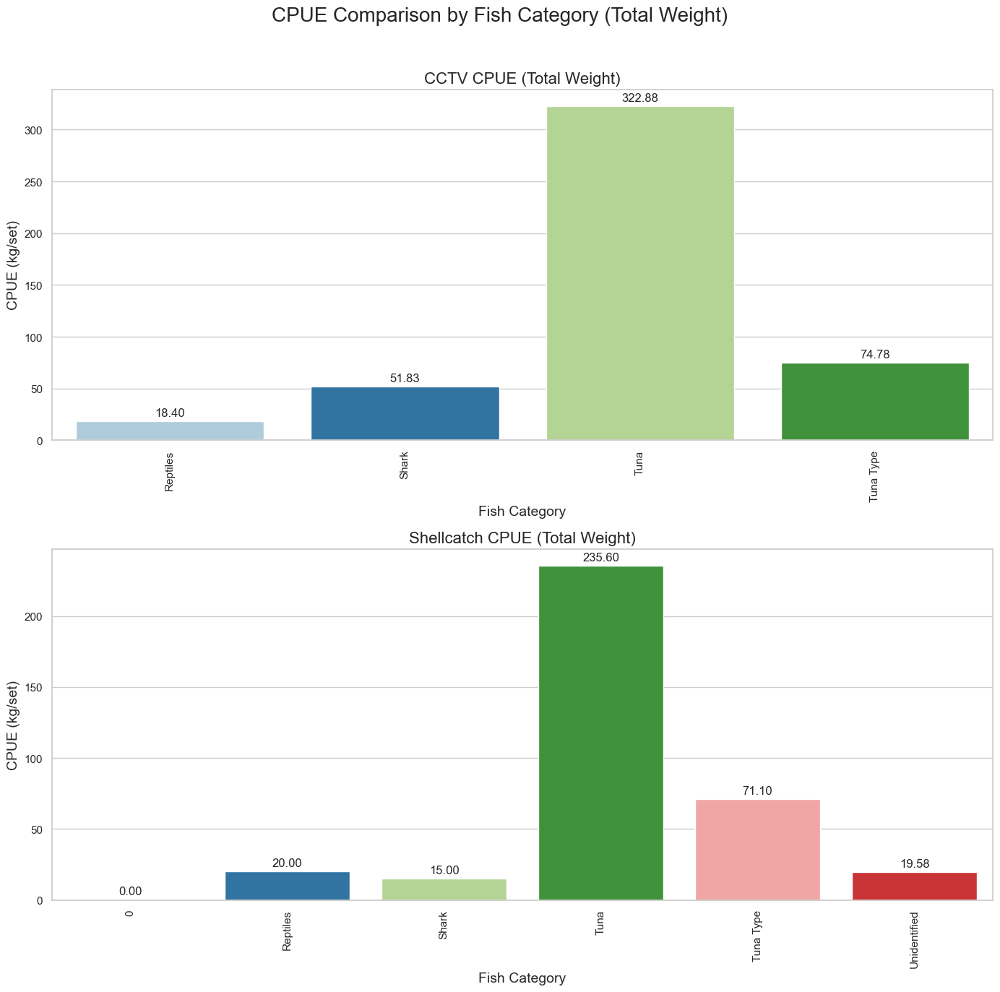

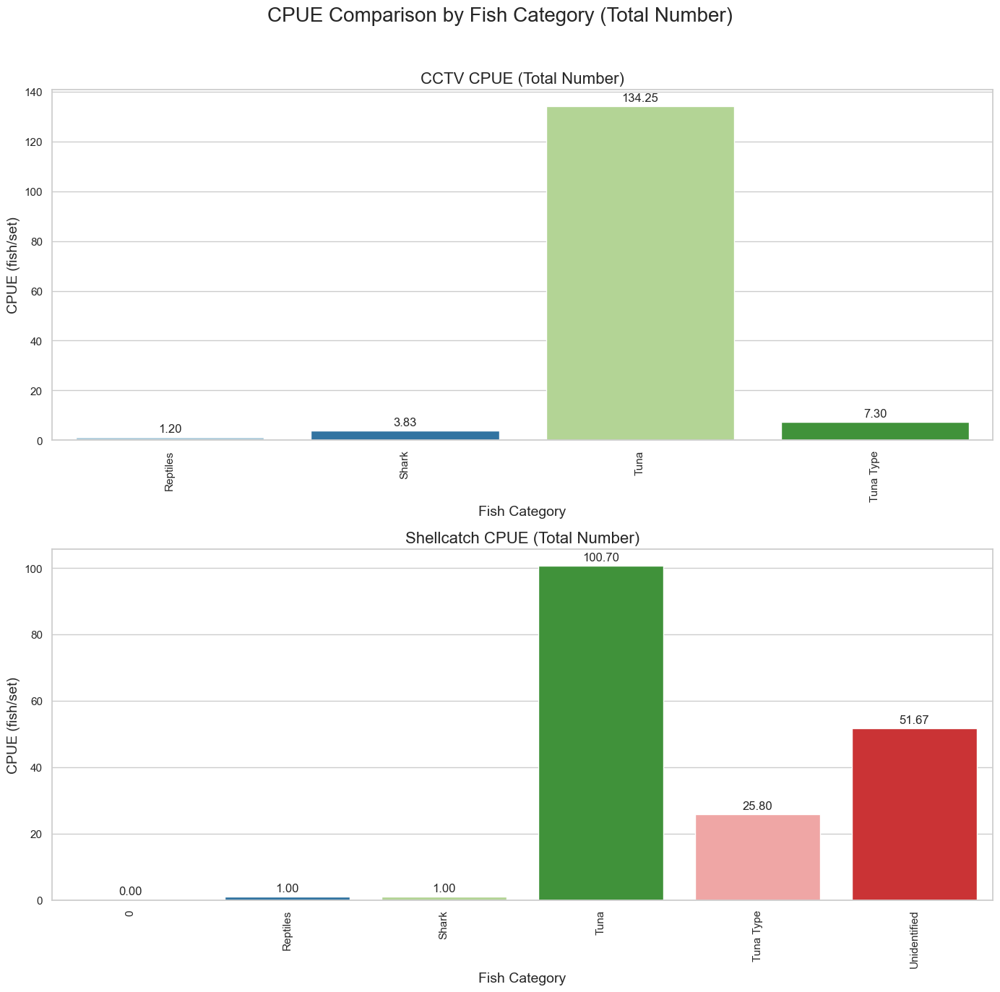

In [169]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel file from the specified path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Function to calculate CPUE based on the number of gillnet sets for each fish category
def calculate_cpue_by_category(df, total_catch_column):
    cpue_by_category = df.groupby('Fish Category').apply(lambda x: x[total_catch_column].sum() / x['Date of Fishing'].nunique() if x['Date of Fishing'].nunique() != 0 else 0)
    cpue_by_category = cpue_by_category.reset_index(name='CPUE')
    return cpue_by_category

# Split the dataset into CCTV and Shellcatch
cctv_data = df[df['EMS'] == 'CCTV']
shellcatch_data = df[df['EMS'] == 'Shellcatch']

# Calculate CPUE for each fish category for CCTV and Shellcatch
cctv_cpue_weight = calculate_cpue_by_category(cctv_data, 'Total Weight (kg)')
cctv_cpue_number = calculate_cpue_by_category(cctv_data, 'Total Number')

shellcatch_cpue_weight = calculate_cpue_by_category(shellcatch_data, 'Total Weight (kg)')
shellcatch_cpue_number = calculate_cpue_by_category(shellcatch_data, 'Total Number')

# Set the style and color palette for the plots
sns.set(style="whitegrid")
palette = sns.color_palette("dark")

# Plotting the CPUE values for Total Weight for each fish category
fig, axes = plt.subplots(2, 1, figsize=(14, 14))
fig.suptitle('CPUE Comparison by Fish Category (Total Weight)', fontsize=20)

# Plot CCTV Total Weight by fish category
sns.barplot(ax=axes[0], x='Fish Category', y='CPUE', data=cctv_cpue_weight, palette='Paired')
axes[0].set_title('CCTV CPUE (Total Weight)', fontsize=16)
axes[0].set_ylabel('CPUE (kg/set)', fontsize=14)
axes[0].set_xlabel('Fish Category', fontsize=14)
axes[0].tick_params(axis='x', rotation=90)
axes[0].bar_label(axes[0].containers[0], fmt='%.2f', padding=3)

# Plot Shellcatch Total Weight by fish category
sns.barplot(ax=axes[1], x='Fish Category', y='CPUE', data=shellcatch_cpue_weight, palette='Paired')
axes[1].set_title('Shellcatch CPUE (Total Weight)', fontsize=16)
axes[1].set_ylabel('CPUE (kg/set)', fontsize=14)
axes[1].set_xlabel('Fish Category', fontsize=14)
axes[1].tick_params(axis='x', rotation=90)
axes[1].bar_label(axes[1].containers[0], fmt='%.2f', padding=3)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Plotting the CPUE values for Total Number for each fish category
fig, axes = plt.subplots(2, 1, figsize=(14, 14))
fig.suptitle('CPUE Comparison by Fish Category (Total Number)', fontsize=20)

# Plot CCTV Total Number by fish category
sns.barplot(ax=axes[0], x='Fish Category', y='CPUE', data=cctv_cpue_number, palette='Paired')
axes[0].set_title('CCTV CPUE (Total Number)', fontsize=16)
axes[0].set_ylabel('CPUE (fish/set)', fontsize=14)
axes[0].set_xlabel('Fish Category', fontsize=14)
axes[0].tick_params(axis='x', rotation=90)
axes[0].bar_label(axes[0].containers[0], fmt='%.2f', padding=3)

# Plot Shellcatch Total Number by fish category
sns.barplot(ax=axes[1], x='Fish Category', y='CPUE', data=shellcatch_cpue_number, palette='Paired')
axes[1].set_title('Shellcatch CPUE (Total Number)', fontsize=16)
axes[1].set_ylabel('CPUE (fish/set)', fontsize=14)
axes[1].set_xlabel('Fish Category', fontsize=14)
axes[1].tick_params(axis='x', rotation=90)
axes[1].bar_label(axes[1].containers[0], fmt='%.2f', padding=3)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


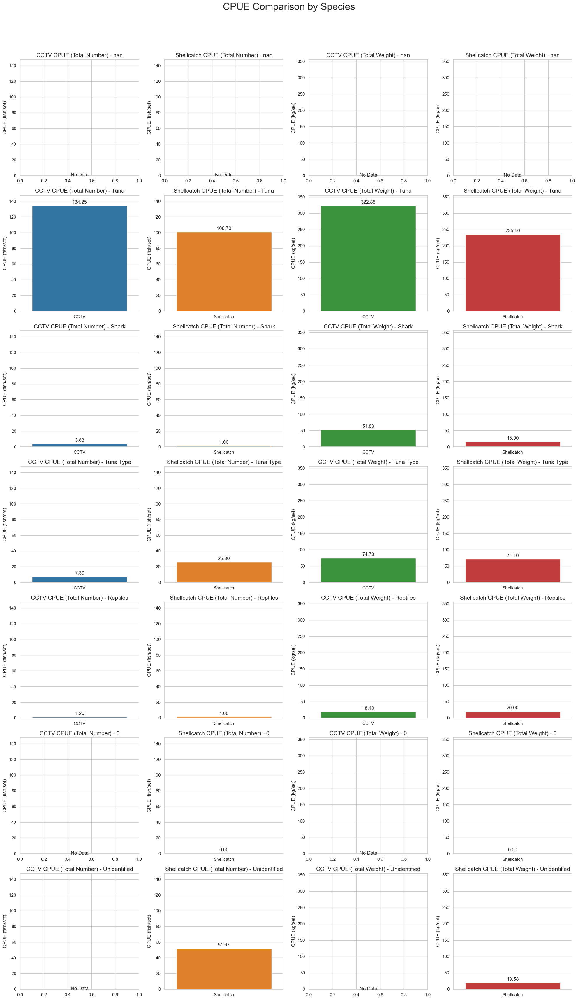

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel file from the specified path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Function to calculate CPUE based on the number of gillnet sets for each species
def calculate_cpue_by_species(df, total_catch_column):
    cpue_by_species = df.groupby('Fish Category').apply(lambda x: x[total_catch_column].sum() / x['Date of Fishing'].nunique() if x['Date of Fishing'].nunique() != 0 else 0)
    cpue_by_species = cpue_by_species.reset_index(name='CPUE')
    return cpue_by_species

# Split the dataset into CCTV and Shellcatch
cctv_data = df[df['EMS'] == 'CCTV']
shellcatch_data = df[df['EMS'] == 'Shellcatch']

# Calculate CPUE for each species for CCTV and Shellcatch
cctv_cpue_weight = calculate_cpue_by_species(cctv_data, 'Total Weight (kg)')
cctv_cpue_number = calculate_cpue_by_species(cctv_data, 'Total Number')

shellcatch_cpue_weight = calculate_cpue_by_species(shellcatch_data, 'Total Weight (kg)')
shellcatch_cpue_number = calculate_cpue_by_species(shellcatch_data, 'Total Number')

# Get the unique species
species_list = df['Fish Category'].unique()

# Set the style and color palette for the plots
sns.set(style="whitegrid")
palette = sns.color_palette("tab10")

# Determine the maximum CPUE values for consistent y-axis limits
max_cpue_number = max(cctv_cpue_number['CPUE'].max(), shellcatch_cpue_number['CPUE'].max())
max_cpue_weight = max(cctv_cpue_weight['CPUE'].max(), shellcatch_cpue_weight['CPUE'].max())

# Create subplots for each species separately for CCTV and Shellcatch
fig, axes = plt.subplots(len(species_list), 4, figsize=(20, len(species_list) * 5))
fig.suptitle('CPUE Comparison by Species', fontsize=24)

for i, species in enumerate(species_list):
    # Filter data for the current species
    cctv_species_weight = cctv_cpue_weight[cctv_cpue_weight['Fish Category'] == species]
    cctv_species_number = cctv_cpue_number[cctv_cpue_number['Fish Category'] == species]
    shellcatch_species_weight = shellcatch_cpue_weight[shellcatch_cpue_weight['Fish Category'] == species]
    shellcatch_species_number = shellcatch_cpue_number[shellcatch_cpue_number['Fish Category'] == species]
    
    # Plot CCTV Total Number by species
    if not cctv_species_number.empty:
        sns.barplot(ax=axes[i, 0], x=['CCTV'], y=cctv_species_number['CPUE'], palette=[palette[0]])
        axes[i, 0].set_title(f'CCTV CPUE (Total Number) - {species}', fontsize=14)
        axes[i, 0].set_ylabel('CPUE (fish/set)', fontsize=12)
        axes[i, 0].set_ylim(0, max_cpue_number * 1.1)
        axes[i, 0].set_xlabel('')
        for container in axes[i, 0].containers:
            axes[i, 0].bar_label(container, fmt='%.2f', padding=3)
    else:
        axes[i, 0].set_title(f'CCTV CPUE (Total Number) - {species}', fontsize=14)
        axes[i, 0].set_ylabel('CPUE (fish/set)', fontsize=12)
        axes[i, 0].set_ylim(0, max_cpue_number * 1.1)
        axes[i, 0].set_xlabel('')
        axes[i, 0].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=12)
    
    # Plot Shellcatch Total Number by species
    if not shellcatch_species_number.empty:
        sns.barplot(ax=axes[i, 1], x=['Shellcatch'], y=shellcatch_species_number['CPUE'], palette=[palette[1]])
        axes[i, 1].set_title(f'Shellcatch CPUE (Total Number) - {species}', fontsize=14)
        axes[i, 1].set_ylabel('CPUE (fish/set)', fontsize=12)
        axes[i, 1].set_ylim(0, max_cpue_number * 1.1)
        axes[i, 1].set_xlabel('')
        for container in axes[i, 1].containers:
            axes[i, 1].bar_label(container, fmt='%.2f', padding=3)
    else:
        axes[i, 1].set_title(f'Shellcatch CPUE (Total Number) - {species}', fontsize=14)
        axes[i, 1].set_ylabel('CPUE (fish/set)', fontsize=12)
        axes[i, 1].set_ylim(0, max_cpue_number * 1.1)
        axes[i, 1].set_xlabel('')
        axes[i, 1].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=12)
    
    # Plot CCTV Total Weight by species
    if not cctv_species_weight.empty:
        sns.barplot(ax=axes[i, 2], x=['CCTV'], y=cctv_species_weight['CPUE'], palette=[palette[2]])
        axes[i, 2].set_title(f'CCTV CPUE (Total Weight) - {species}', fontsize=14)
        axes[i, 2].set_ylabel('CPUE (kg/set)', fontsize=12)
        axes[i, 2].set_ylim(0, max_cpue_weight * 1.1)
        axes[i, 2].set_xlabel('')
        for container in axes[i, 2].containers:
            axes[i, 2].bar_label(container, fmt='%.2f', padding=3)
    else:
        axes[i, 2].set_title(f'CCTV CPUE (Total Weight) - {species}', fontsize=14)
        axes[i, 2].set_ylabel('CPUE (kg/set)', fontsize=12)
        axes[i, 2].set_ylim(0, max_cpue_weight * 1.1)
        axes[i, 2].set_xlabel('')
        axes[i, 2].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=12)
    
    # Plot Shellcatch Total Weight by species
    if not shellcatch_species_weight.empty:
        sns.barplot(ax=axes[i, 3], x=['Shellcatch'], y=shellcatch_species_weight['CPUE'], palette=[palette[3]])
        axes[i, 3].set_title(f'Shellcatch CPUE (Total Weight) - {species}', fontsize=14)
        axes[i, 3].set_ylabel('CPUE (kg/set)', fontsize=12)
        axes[i, 3].set_ylim(0, max_cpue_weight * 1.1)
        axes[i, 3].set_xlabel('')
        for container in axes[i, 3].containers:
            axes[i, 3].bar_label(container, fmt='%.2f', padding=3)
    else:
        axes[i, 3].set_title(f'Shellcatch CPUE (Total Weight) - {species}', fontsize=14)
        axes[i, 3].set_ylabel('CPUE (kg/set)', fontsize=12)
        axes[i, 3].set_ylim(0, max_cpue_weight * 1.1)
        axes[i, 3].set_xlabel('')
        axes[i, 3].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


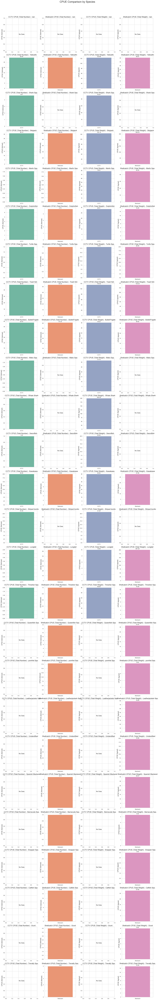

In [177]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel file from the specified path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Function to calculate CPUE based on the number of gillnet sets for each species
def calculate_cpue_by_species(df, total_catch_column):
    cpue_by_species = df.groupby('Spp.').apply(lambda x: x[total_catch_column].sum() / x['Date of Fishing'].nunique() if x['Date of Fishing'].nunique() != 0 else 0)
    cpue_by_species = cpue_by_species.reset_index(name='CPUE')
    return cpue_by_species

# Split the dataset into CCTV and Shellcatch
cctv_data = df[df['EMS'] == 'CCTV']
shellcatch_data = df[df['EMS'] == 'Shellcatch']

# Calculate CPUE for each species for CCTV and Shellcatch
cctv_cpue_weight = calculate_cpue_by_species(cctv_data, 'Total Weight (kg)')
cctv_cpue_number = calculate_cpue_by_species(cctv_data, 'Total Number')

shellcatch_cpue_weight = calculate_cpue_by_species(shellcatch_data, 'Total Weight (kg)')
shellcatch_cpue_number = calculate_cpue_by_species(shellcatch_data, 'Total Number')

# Get the unique species
species_list = df['Spp.'].unique()

# Set the style and color palette for the plots
sns.set(style="whitegrid")
palette = sns.color_palette("Set2")

# Create subplots for each species separately for CCTV and Shellcatch
fig, axes = plt.subplots(len(species_list), 4, figsize=(20, len(species_list) * 5))
fig.suptitle('CPUE Comparison by Species', fontsize=24)

for i, species in enumerate(species_list):
    # Filter data for the current species
    cctv_species_weight = cctv_cpue_weight[cctv_cpue_weight['Spp.'] == species]
    cctv_species_number = cctv_cpue_number[cctv_cpue_number['Spp.'] == species]
    shellcatch_species_weight = shellcatch_cpue_weight[shellcatch_cpue_weight['Spp.'] == species]
    shellcatch_species_number = shellcatch_cpue_number[shellcatch_cpue_number['Spp.'] == species]
    
    # Plot CCTV Total Number by species
    if not cctv_species_number.empty:
        sns.barplot(ax=axes[i, 0], x=['CCTV'], y=cctv_species_number['CPUE'], palette=[palette[0]])
        axes[i, 0].set_title(f'CCTV CPUE (Total Number) - {species}', fontsize=16)
        axes[i, 0].set_ylabel('CPUE (fish/set)', fontsize=14)
        axes[i, 0].set_xlabel('')
        for container in axes[i, 0].containers:
            axes[i, 0].bar_label(container, fmt='%.2f', padding=3)
    else:
        axes[i, 0].set_title(f'CCTV CPUE (Total Number) - {species}', fontsize=16)
        axes[i, 0].set_ylabel('CPUE (fish/set)', fontsize=14)
        axes[i, 0].set_xlabel('')
        axes[i, 0].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=14)
    
    # Plot Shellcatch Total Number by species
    if not shellcatch_species_number.empty:
        sns.barplot(ax=axes[i, 1], x=['Shellcatch'], y=shellcatch_species_number['CPUE'], palette=[palette[1]])
        axes[i, 1].set_title(f'Shellcatch CPUE (Total Number) - {species}', fontsize=16)
        axes[i, 1].set_ylabel('CPUE (fish/set)', fontsize=14)
        axes[i, 1].set_xlabel('')
        for container in axes[i, 1].containers:
            axes[i, 1].bar_label(container, fmt='%.2f', padding=3)
    else:
        axes[i, 1].set_title(f'Shellcatch CPUE (Total Number) - {species}', fontsize=16)
        axes[i, 1].set_ylabel('CPUE (fish/set)', fontsize=14)
        axes[i, 1].set_xlabel('')
        axes[i, 1].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=14)
    
    # Plot CCTV Total Weight by species
    if not cctv_species_weight.empty:
        sns.barplot(ax=axes[i, 2], x=['CCTV'], y=cctv_species_weight['CPUE'], palette=[palette[2]])
        axes[i, 2].set_title(f'CCTV CPUE (Total Weight) - {species}', fontsize=16)
        axes[i, 2].set_ylabel('CPUE (kg/set)', fontsize=14)
        axes[i, 2].set_xlabel('')
        for container in axes[i, 2].containers:
            axes[i, 2].bar_label(container, fmt='%.2f', padding=3)
    else:
        axes[i, 2].set_title(f'CCTV CPUE (Total Weight) - {species}', fontsize=16)
        axes[i, 2].set_ylabel('CPUE (kg/set)', fontsize=14)
        axes[i, 2].set_xlabel('')
        axes[i, 2].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=14)
    
    # Plot Shellcatch Total Weight by species
    if not shellcatch_species_weight.empty:
        sns.barplot(ax=axes[i, 3], x=['Shellcatch'], y=shellcatch_species_weight['CPUE'], palette=[palette[3]])
        axes[i, 3].set_title(f'Shellcatch CPUE (Total Weight) - {species}', fontsize=16)
        axes[i, 3].set_ylabel('CPUE (kg/set)', fontsize=14)
        axes[i, 3].set_xlabel('')
        for container in axes[i, 3].containers:
            axes[i, 3].bar_label(container, fmt='%.2f', padding=3)
    else:
        axes[i, 3].set_title(f'Shellcatch CPUE (Total Weight) - {species}', fontsize=16)
        axes[i, 3].set_ylabel('CPUE (kg/set)', fontsize=14)
        axes[i, 3].set_xlabel('')
        axes[i, 3].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=14)

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


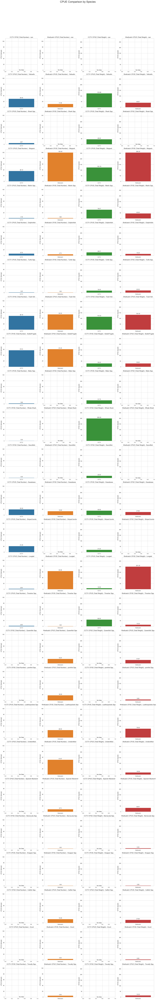

In [178]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel file from the specified path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Function to calculate CPUE based on the number of gillnet sets for each species
def calculate_cpue_by_species(df, total_catch_column):
    cpue_by_species = df.groupby('Spp.').apply(lambda x: x[total_catch_column].sum() / x['Date of Fishing'].nunique() if x['Date of Fishing'].nunique() != 0 else 0)
    cpue_by_species = cpue_by_species.reset_index(name='CPUE')
    return cpue_by_species

# Split the dataset into CCTV and Shellcatch
cctv_data = df[df['EMS'] == 'CCTV']
shellcatch_data = df[df['EMS'] == 'Shellcatch']

# Calculate CPUE for each species for CCTV and Shellcatch
cctv_cpue_weight = calculate_cpue_by_species(cctv_data, 'Total Weight (kg)')
cctv_cpue_number = calculate_cpue_by_species(cctv_data, 'Total Number')

shellcatch_cpue_weight = calculate_cpue_by_species(shellcatch_data, 'Total Weight (kg)')
shellcatch_cpue_number = calculate_cpue_by_species(shellcatch_data, 'Total Number')

# Get the unique species
species_list = df['Spp.'].unique()

# Set the style and color palette for the plots
sns.set(style="whitegrid")
palette = sns.color_palette("tab10")

# Determine the maximum CPUE values for consistent y-axis limits
max_cpue_number = max(cctv_cpue_number['CPUE'].max(), shellcatch_cpue_number['CPUE'].max())
max_cpue_weight = max(cctv_cpue_weight['CPUE'].max(), shellcatch_cpue_weight['CPUE'].max())

# Create subplots for each species separately for CCTV and Shellcatch
fig, axes = plt.subplots(len(species_list), 4, figsize=(20, len(species_list) * 5))
fig.suptitle('CPUE Comparison by Species', fontsize=24)

for i, species in enumerate(species_list):
    # Filter data for the current species
    cctv_species_weight = cctv_cpue_weight[cctv_cpue_weight['Spp.'] == species]
    cctv_species_number = cctv_cpue_number[cctv_cpue_number['Spp.'] == species]
    shellcatch_species_weight = shellcatch_cpue_weight[shellcatch_cpue_weight['Spp.'] == species]
    shellcatch_species_number = shellcatch_cpue_number[shellcatch_cpue_number['Spp.'] == species]
    
    # Plot CCTV Total Number by species
    if not cctv_species_number.empty:
        sns.barplot(ax=axes[i, 0], x=['CCTV'], y=cctv_species_number['CPUE'], palette=[palette[0]])
        axes[i, 0].set_title(f'CCTV CPUE (Total Number) - {species}', fontsize=14)
        axes[i, 0].set_ylabel('CPUE (fish/set)', fontsize=12)
        axes[i, 0].set_ylim(0, max_cpue_number * 1.1)
        axes[i, 0].set_xlabel('')
        for container in axes[i, 0].containers:
            axes[i, 0].bar_label(container, fmt='%.2f', padding=3)
    else:
        axes[i, 0].set_title(f'CCTV CPUE (Total Number) - {species}', fontsize=14)
        axes[i, 0].set_ylabel('CPUE (fish/set)', fontsize=12)
        axes[i, 0].set_ylim(0, max_cpue_number * 1.1)
        axes[i, 0].set_xlabel('')
        axes[i, 0].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=12)
    
    # Plot Shellcatch Total Number by species
    if not shellcatch_species_number.empty:
        sns.barplot(ax=axes[i, 1], x=['Shellcatch'], y=shellcatch_species_number['CPUE'], palette=[palette[1]])
        axes[i, 1].set_title(f'Shellcatch CPUE (Total Number) - {species}', fontsize=14)
        axes[i, 1].set_ylabel('CPUE (fish/set)', fontsize=12)
        axes[i, 1].set_ylim(0, max_cpue_number * 1.1)
        axes[i, 1].set_xlabel('')
        for container in axes[i, 1].containers:
            axes[i, 1].bar_label(container, fmt='%.2f', padding=3)
    else:
        axes[i, 1].set_title(f'Shellcatch CPUE (Total Number) - {species}', fontsize=14)
        axes[i, 1].set_ylabel('CPUE (fish/set)', fontsize=12)
        axes[i, 1].set_ylim(0, max_cpue_number * 1.1)
        axes[i, 1].set_xlabel('')
        axes[i, 1].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=12)
    
    # Plot CCTV Total Weight by species
    if not cctv_species_weight.empty:
        sns.barplot(ax=axes[i, 2], x=['CCTV'], y=cctv_species_weight['CPUE'], palette=[palette[2]])
        axes[i, 2].set_title(f'CCTV CPUE (Total Weight) - {species}', fontsize=14)
        axes[i, 2].set_ylabel('CPUE (kg/set)', fontsize=12)
        axes[i, 2].set_ylim(0, max_cpue_weight * 1.1)
        axes[i, 2].set_xlabel('')
        for container in axes[i, 2].containers:
            axes[i, 2].bar_label(container, fmt='%.2f', padding=3)
    else:
        axes[i, 2].set_title(f'CCTV CPUE (Total Weight) - {species}', fontsize=14)
        axes[i, 2].set_ylabel('CPUE (kg/set)', fontsize=12)
        axes[i, 2].set_ylim(0, max_cpue_weight * 1.1)
        axes[i, 2].set_xlabel('')
        axes[i, 2].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=12)
    
    # Plot Shellcatch Total Weight by species
    if not shellcatch_species_weight.empty:
        sns.barplot(ax=axes[i, 3], x=['Shellcatch'], y=shellcatch_species_weight['CPUE'], palette=[palette[3]])
        axes[i, 3].set_title(f'Shellcatch CPUE (Total Weight) - {species}', fontsize=14)
        axes[i, 3].set_ylabel('CPUE (kg/set)', fontsize=12)
        axes[i, 3].set_ylim(0, max_cpue_weight * 1.1)
        axes[i, 3].set_xlabel('')
        for container in axes[i, 3].containers:
            axes[i, 3].bar_label(container, fmt='%.2f', padding=3)
    else:
        axes[i, 3].set_title(f'Shellcatch CPUE (Total Weight) - {species}', fontsize=14)
        axes[i, 3].set_ylabel('CPUE (kg/set)', fontsize=12)
        axes[i, 3].set_ylim(0, max_cpue_weight * 1.1)
        axes[i, 3].set_xlabel('')
        axes[i, 3].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


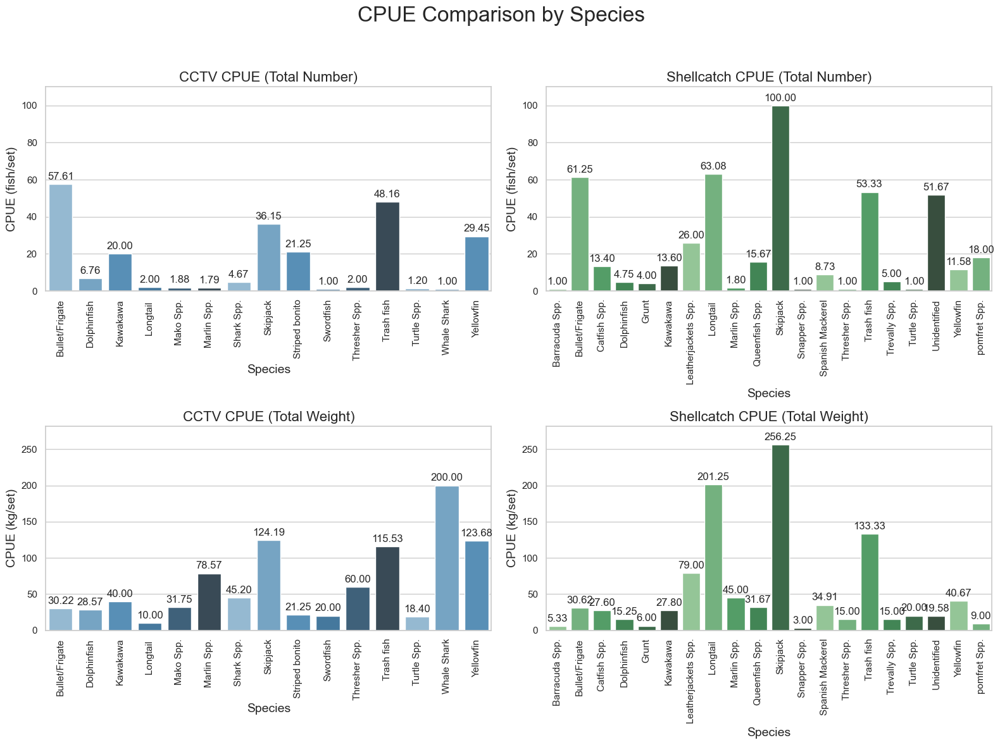

          Species  CPUE_weight_CCTV  CPUE_number_CCTV  CPUE_weight_Shellcatch  \
0  Bullet/Frigate         30.217391         57.608696               30.625000   
1     Dolphinfish         28.571429          6.761905               15.250000   
2        Kawakawa         40.000000         20.000000               27.800000   
3       Longtail          10.000000          2.000000              201.250000   
4     Marlin Spp.         78.571429          1.785714               45.000000   
5        Skipjack        124.185185         36.148148              256.250000   
6   Thresher Spp.         60.000000          2.000000               15.000000   
7      Trash fish        115.526316         48.157895              133.333333   
8     Turtle Spp.         18.400000          1.200000               20.000000   
9       Yellowfin        123.677419         29.451613               40.666667   

   CPUE_number_Shellcatch  
0               61.250000  
1                4.750000  
2               13.60000

In [181]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel file from the specified path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Function to calculate CPUE based on the number of gillnet sets for each species
def calculate_cpue_by_species(df, total_catch_column):
    cpue_by_species = df.groupby('Spp.').apply(lambda x: x[total_catch_column].sum() / x['Date of Fishing'].nunique() if x['Date of Fishing'].nunique() != 0 else 0)
    cpue_by_species = cpue_by_species.reset_index(name='CPUE')
    return cpue_by_species

# Split the dataset into CCTV and Shellcatch
cctv_data = df[df['EMS'] == 'CCTV']
shellcatch_data = df[df['EMS'] == 'Shellcatch']

# Calculate CPUE for each species for CCTV and Shellcatch
cctv_cpue_weight = calculate_cpue_by_species(cctv_data, 'Total Weight (kg)')
cctv_cpue_number = calculate_cpue_by_species(cctv_data, 'Total Number')

shellcatch_cpue_weight = calculate_cpue_by_species(shellcatch_data, 'Total Weight (kg)')
shellcatch_cpue_number = calculate_cpue_by_species(shellcatch_data, 'Total Number')

# Get the unique species
species_list = df['Spp.'].unique()

# Set the style and color palette for the plots
sns.set(style="whitegrid")
cctv_palette = sns.color_palette("Blues_d")
shellcatch_palette = sns.color_palette("Greens_d")

# Determine the maximum CPUE values for consistent y-axis limits
max_cpue_number = max(cctv_cpue_number['CPUE'].max(), shellcatch_cpue_number['CPUE'].max())
max_cpue_weight = max(cctv_cpue_weight['CPUE'].max(), shellcatch_cpue_weight['CPUE'].max())

# Create subplots for each species separately for CCTV and Shellcatch
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('CPUE Comparison by Species', fontsize=24)

# Plot CCTV Total Number by species
sns.barplot(ax=axes[0, 0], x='Spp.', y='CPUE', data=cctv_cpue_number, palette=cctv_palette)
axes[0, 0].set_title('CCTV CPUE (Total Number)', fontsize=16)
axes[0, 0].set_ylabel('CPUE (fish/set)', fontsize=14)
axes[0, 0].set_xlabel('Species', fontsize=14)
axes[0, 0].tick_params(axis='x', rotation=90)
for container in axes[0, 0].containers:
    axes[0, 0].bar_label(container, fmt='%.2f', padding=3)
axes[0, 0].set_ylim(0, max_cpue_number * 1.1)

# Plot Shellcatch Total Number by species
sns.barplot(ax=axes[0, 1], x='Spp.', y='CPUE', data=shellcatch_cpue_number, palette=shellcatch_palette)
axes[0, 1].set_title('Shellcatch CPUE (Total Number)', fontsize=16)
axes[0, 1].set_ylabel('CPUE (fish/set)', fontsize=14)
axes[0, 1].set_xlabel('Species', fontsize=14)
axes[0, 1].tick_params(axis='x', rotation=90)
for container in axes[0, 1].containers:
    axes[0, 1].bar_label(container, fmt='%.2f', padding=3)
axes[0, 1].set_ylim(0, max_cpue_number * 1.1)

# Plot CCTV Total Weight by species
sns.barplot(ax=axes[1, 0], x='Spp.', y='CPUE', data=cctv_cpue_weight, palette=cctv_palette)
axes[1, 0].set_title('CCTV CPUE (Total Weight)', fontsize=16)
axes[1, 0].set_ylabel('CPUE (kg/set)', fontsize=14)
axes[1, 0].set_xlabel('Species', fontsize=14)
axes[1, 0].tick_params(axis='x', rotation=90)
for container in axes[1, 0].containers:
    axes[1, 0].bar_label(container, fmt='%.2f', padding=3)
axes[1, 0].set_ylim(0, max_cpue_weight * 1.1)

# Plot Shellcatch Total Weight by species
sns.barplot(ax=axes[1, 1], x='Spp.', y='CPUE', data=shellcatch_cpue_weight, palette=shellcatch_palette)
axes[1, 1].set_title('Shellcatch CPUE (Total Weight)', fontsize=16)
axes[1, 1].set_ylabel('CPUE (kg/set)', fontsize=14)
axes[1, 1].set_xlabel('Species', fontsize=14)
axes[1, 1].tick_params(axis='x', rotation=90)
for container in axes[1, 1].containers:
    axes[1, 1].bar_label(container, fmt='%.2f', padding=3)
axes[1, 1].set_ylim(0, max_cpue_weight * 1.1)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Display the summary table
summary_table = pd.merge(cctv_cpue_weight, cctv_cpue_number, on='Spp.', suffixes=('_weight_CCTV', '_number_CCTV'))
summary_table = pd.merge(summary_table, shellcatch_cpue_weight, on='Spp.', suffixes=('', '_weight_Shellcatch'))
summary_table = pd.merge(summary_table, shellcatch_cpue_number, on='Spp.', suffixes=('', '_number_Shellcatch'))
summary_table.columns = ['Species', 'CPUE_weight_CCTV', 'CPUE_number_CCTV', 'CPUE_weight_Shellcatch', 'CPUE_number_Shellcatch']

print(summary_table)


The Catch Per Unit Effort (CPUE) is a commonly used measure in fisheries science to estimate fish abundance. For gillnet fisheries, CPUE can be calculated using the following formula:

\[ \text{CPUE} = \frac{\text{Total Catch}}{\text{Total Effort}} \]

Where:
- **Total Catch** is the total weight (or number) of fish caught.
- **Total Effort** is the measure of effort exerted, often quantified as the number of gillnet sets, the total length of the gillnet used, or the total time the gillnets were in the water.

### Examples of Effort Units
1. **Number of gillnet sets**: If effort is measured by the number of times gillnets are set, then the formula becomes:
   \[ \text{CPUE} = \frac{\text{Total Catch}}{\text{Number of Gillnet Sets}} \]

2. **Length of gillnet**: If effort is measured by the total length of gillnets used, then the formula becomes:
   \[ \text{CPUE} = \frac{\text{Total Catch}}{\text{Total Length of Gillnet (e.g., in kilometers or meters)}} \]

3. **Time**: If effort is measured by the total time gillnets are in the water, then the formula becomes:
   \[ \text{CPUE} = \frac{\text{Total Catch}}{\text{Total Time (e.g., hours or days)}} \]

### Example Calculation
If a gillnet fishery caught 1000 kg of fish with 10 gillnet sets, the CPUE would be calculated as:
\[ \text{CPUE} = \frac{1000 \text{ kg}}{10 \text{ sets}} = 100 \text{ kg/set} \]



In [5]:
# 2. Lenght of Gillnet: If effort is measured by the total length of gillnets used, then the formula becomes:
#CPUE= Total Catch/ Total Lenght of net in Km/ m

In [ ]:
#CPUE based on the total length of gillnet - in meters , Species for each month

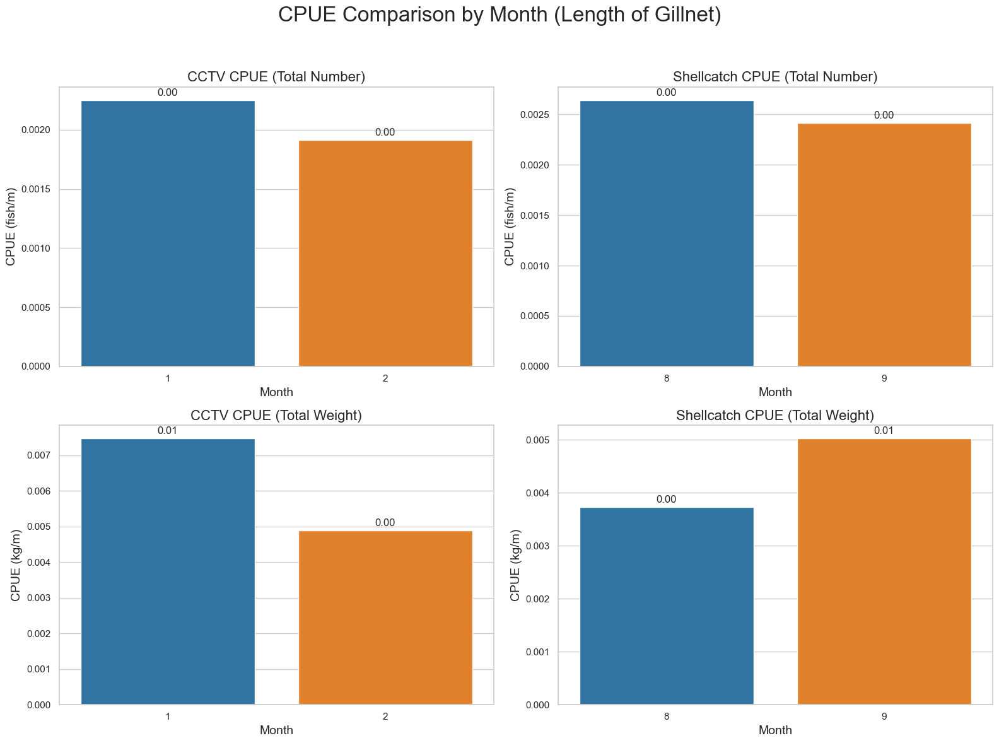

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel file from the specified path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Ensure the Date of Fishing column is in datetime format
df['Date of Fishing'] = pd.to_datetime(df['Date of Fishing'])

# Extract month from the Date of Fishing column
df['Month'] = df['Date of Fishing'].dt.month

# Function to calculate CPUE based on the total length of gillnet used for each month
def calculate_cpue_by_gillnet_length(df, total_catch_column):
    cpue_by_month = df.groupby('Month').apply(
        lambda x: x[total_catch_column].sum() / x['Length of Net (m)'].sum() if x['Length of Net (m)'].sum() != 0 else 0
    )
    cpue_by_month = cpue_by_month.reset_index(name='CPUE')
    return cpue_by_month

# Split the dataset into CCTV and Shellcatch
cctv_data = df[df['EMS'] == 'CCTV']
shellcatch_data = df[df['EMS'] == 'Shellcatch']

# Calculate CPUE for each month for CCTV and Shellcatch using Total Number and Total Weight
cctv_cpue_weight = calculate_cpue_by_gillnet_length(cctv_data, 'Total Weight (kg)')
cctv_cpue_number = calculate_cpue_by_gillnet_length(cctv_data, 'Total Number')

shellcatch_cpue_weight = calculate_cpue_by_gillnet_length(shellcatch_data, 'Total Weight (kg)')
shellcatch_cpue_number = calculate_cpue_by_gillnet_length(shellcatch_data, 'Total Number')

# Set the style and color palette for the plots
sns.set(style="whitegrid")
palette = sns.color_palette("tab10")

# Create subplots for each month separately for CCTV and Shellcatch
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('CPUE Comparison by Month (Length of Gillnet)', fontsize=24)

# Plot CCTV Total Number by month
sns.barplot(ax=axes[0, 0], x='Month', y='CPUE', data=cctv_cpue_number, palette=palette)
axes[0, 0].set_title('CCTV CPUE (Total Number)', fontsize=16)
axes[0, 0].set_ylabel('CPUE (fish/m)', fontsize=14)
axes[0, 0].set_xlabel('Month', fontsize=14)
for container in axes[0, 0].containers:
    axes[0, 0].bar_label(container, fmt='%.2f', padding=3)

# Plot Shellcatch Total Number by month
sns.barplot(ax=axes[0, 1], x='Month', y='CPUE', data=shellcatch_cpue_number, palette=palette)
axes[0, 1].set_title('Shellcatch CPUE (Total Number)', fontsize=16)
axes[0, 1].set_ylabel('CPUE (fish/m)', fontsize=14)
axes[0, 1].set_xlabel('Month', fontsize=14)
for container in axes[0, 1].containers:
    axes[0, 1].bar_label(container, fmt='%.2f', padding=3)

# Plot CCTV Total Weight by month
sns.barplot(ax=axes[1, 0], x='Month', y='CPUE', data=cctv_cpue_weight, palette=palette)
axes[1, 0].set_title('CCTV CPUE (Total Weight)', fontsize=16)
axes[1, 0].set_ylabel('CPUE (kg/m)', fontsize=14)
axes[1, 0].set_xlabel('Month', fontsize=14)
for container in axes[1, 0].containers:
    axes[1, 0].bar_label(container, fmt='%.2f', padding=3)

# Plot Shellcatch Total Weight by month
sns.barplot(ax=axes[1, 1], x='Month', y='CPUE', data=shellcatch_cpue_weight, palette=palette)
axes[1, 1].set_title('Shellcatch CPUE (Total Weight)', fontsize=16)
axes[1, 1].set_ylabel('CPUE (kg/m)', fontsize=14)
axes[1, 1].set_xlabel('Month', fontsize=14)
for container in axes[1, 1].containers:
    axes[1, 1].bar_label(container, fmt='%.2f', padding=3)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [6]:
#CPUE based on the total length of gillnet - in meters , Species 

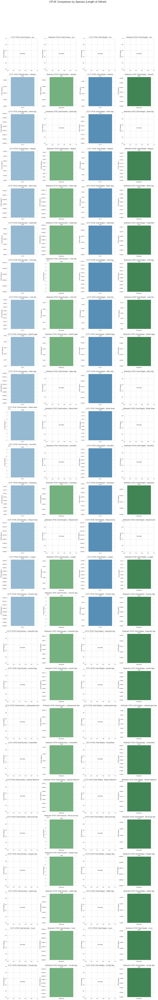

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel file from the specified path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Function to calculate CPUE based on the total length of gillnet used for each species
def calculate_cpue_by_gillnet_length(df, total_catch_column):
    cpue_by_species = df.groupby('Spp.').apply(
        lambda x: x[total_catch_column].sum() / x['Length of Net (m)'].sum() if x['Length of Net (m)'].sum() != 0 else 0
    )
    cpue_by_species = cpue_by_species.reset_index(name='CPUE')
    return cpue_by_species

# Split the dataset into CCTV and Shellcatch
cctv_data = df[df['EMS'] == 'CCTV']
shellcatch_data = df[df['EMS'] == 'Shellcatch']

# Calculate CPUE for each species for CCTV and Shellcatch using Total Number and Total Weight
cctv_cpue_weight = calculate_cpue_by_gillnet_length(cctv_data, 'Total Weight (kg)')
cctv_cpue_number = calculate_cpue_by_gillnet_length(cctv_data, 'Total Number')

shellcatch_cpue_weight = calculate_cpue_by_gillnet_length(shellcatch_data, 'Total Weight (kg)')
shellcatch_cpue_number = calculate_cpue_by_gillnet_length(shellcatch_data, 'Total Number')

# Get the unique species
species_list = df['Spp.'].unique()

# Set the style and color palette for the plots
sns.set(style="whitegrid")
cctv_palette = sns.color_palette("Blues_d")
shellcatch_palette = sns.color_palette("Greens_d")

# Create subplots for each species separately for CCTV and Shellcatch
num_species = len(species_list)
fig, axes = plt.subplots(num_species, 4, figsize=(20, num_species * 5))
fig.suptitle('CPUE Comparison by Species (Length of Gillnet)', fontsize=24)

for i, species in enumerate(species_list):
    # Filter data for the current species
    cctv_species_weight = cctv_cpue_weight[cctv_cpue_weight['Spp.'] == species]
    cctv_species_number = cctv_cpue_number[cctv_cpue_number['Spp.'] == species]
    shellcatch_species_weight = shellcatch_cpue_weight[shellcatch_cpue_weight['Spp.'] == species]
    shellcatch_species_number = shellcatch_cpue_number[shellcatch_cpue_number['Spp.'] == species]
    
    # Plot CCTV Total Number by species
    if not cctv_species_number.empty:
        sns.barplot(ax=axes[i, 0], x=['CCTV'], y=cctv_species_number['CPUE'], palette=[cctv_palette[0]])
        axes[i, 0].set_title(f'CCTV CPUE (Total Number) - {species}', fontsize=14)
        axes[i, 0].set_ylabel('CPUE (fish/m)', fontsize=12)
        axes[i, 0].set_xlabel('')
        for container in axes[i, 0].containers:
            axes[i, 0].bar_label(container, fmt='%.2f', padding=3)
    else:
        axes[i, 0].set_title(f'CCTV CPUE (Total Number) - {species}', fontsize=14)
        axes[i, 0].set_ylabel('CPUE (fish/m)', fontsize=12)
        axes[i, 0].set_xlabel('')
        axes[i, 0].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=12)
    
    # Plot Shellcatch Total Number by species
    if not shellcatch_species_number.empty:
        sns.barplot(ax=axes[i, 1], x=['Shellcatch'], y=shellcatch_species_number['CPUE'], palette=[shellcatch_palette[1]])
        axes[i, 1].set_title(f'Shellcatch CPUE (Total Number) - {species}', fontsize=14)
        axes[i, 1].set_ylabel('CPUE (fish/m)', fontsize=12)
        axes[i, 1].set_xlabel('')
        for container in axes[i, 1].containers:
            axes[i, 1].bar_label(container, fmt='%.2f', padding=3)
    else:
        axes[i, 1].set_title(f'Shellcatch CPUE (Total Number) - {species}', fontsize=14)
        axes[i, 1].set_ylabel('CPUE (fish/m)', fontsize=12)
        axes[i, 1].set_xlabel('')
        axes[i, 1].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=12)
    
    # Plot CCTV Total Weight by species
    if not cctv_species_weight.empty:
        sns.barplot(ax=axes[i, 2], x=['CCTV'], y=cctv_species_weight['CPUE'], palette=[cctv_palette[2]])
        axes[i, 2].set_title(f'CCTV CPUE (Total Weight) - {species}', fontsize=14)
        axes[i, 2].set_ylabel('CPUE (kg/m)', fontsize=12)
        axes[i, 2].set_xlabel('')
        for container in axes[i, 2].containers:
            axes[i, 2].bar_label(container, fmt='%.2f', padding=3)
    else:
        axes[i, 2].set_title(f'CCTV CPUE (Total Weight) - {species}', fontsize=14)
        axes[i, 2].set_ylabel('CPUE (kg/m)', fontsize=12)
        axes[i, 2].set_xlabel('')
        axes[i, 2].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=12)
    
    # Plot Shellcatch Total Weight by species
    if not shellcatch_species_weight.empty:
        sns.barplot(ax=axes[i, 3], x=['Shellcatch'], y=shellcatch_species_weight['CPUE'], palette=[shellcatch_palette[3]])
        axes[i, 3].set_title(f'Shellcatch CPUE (Total Weight) - {species}', fontsize=14)
        axes[i, 3].set_ylabel('CPUE (kg/m)', fontsize=12)
        axes[i, 3].set_xlabel('')
        for container in axes[i, 3].containers:
            axes[i, 3].bar_label(container, fmt='%.2f', padding=3)
    else:
        axes[i, 3].set_title(f'Shellcatch CPUE (Total Weight) - {species}', fontsize=14)
        axes[i, 3].set_ylabel('CPUE (kg/m)', fontsize=12)
        axes[i, 3].set_xlabel('')
        axes[i, 3].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [ ]:
#CPUE based on the total length of gillnet - in meters , Species 

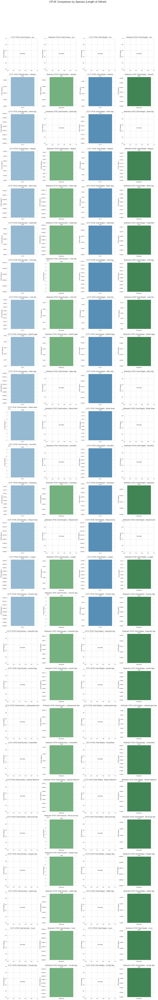

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel file from the specified path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Function to calculate CPUE based on the total length of gillnet used for each species
def calculate_cpue_by_gillnet_length(df, total_catch_column):
    cpue_by_species = df.groupby('Spp.').apply(
        lambda x: x[total_catch_column].sum() / x['Length of Net (m)'].sum() if x['Length of Net (m)'].sum() != 0 else 0
    )
    cpue_by_species = cpue_by_species.reset_index(name='CPUE')
    return cpue_by_species

# Split the dataset into CCTV and Shellcatch
cctv_data = df[df['EMS'] == 'CCTV']
shellcatch_data = df[df['EMS'] == 'Shellcatch']

# Calculate CPUE for each species for CCTV and Shellcatch using Total Number and Total Weight
cctv_cpue_weight = calculate_cpue_by_gillnet_length(cctv_data, 'Total Weight (kg)')
cctv_cpue_number = calculate_cpue_by_gillnet_length(cctv_data, 'Total Number')

shellcatch_cpue_weight = calculate_cpue_by_gillnet_length(shellcatch_data, 'Total Weight (kg)')
shellcatch_cpue_number = calculate_cpue_by_gillnet_length(shellcatch_data, 'Total Number')

# Get the unique species
species_list = df['Spp.'].unique()

# Set the style and color palette for the plots
sns.set(style="whitegrid")
cctv_palette = sns.color_palette("Blues_d")
shellcatch_palette = sns.color_palette("Greens_d")

# Create subplots for each species separately for CCTV and Shellcatch
num_species = len(species_list)
fig, axes = plt.subplots(num_species, 4, figsize=(20, num_species * 5))
fig.suptitle('CPUE Comparison by Species (Length of Gillnet)', fontsize=24)

for i, species in enumerate(species_list):
    # Filter data for the current species
    cctv_species_weight = cctv_cpue_weight[cctv_cpue_weight['Spp.'] == species]
    cctv_species_number = cctv_cpue_number[cctv_cpue_number['Spp.'] == species]
    shellcatch_species_weight = shellcatch_cpue_weight[shellcatch_cpue_weight['Spp.'] == species]
    shellcatch_species_number = shellcatch_cpue_number[shellcatch_cpue_number['Spp.'] == species]
    
    # Plot CCTV Total Number by species
    if not cctv_species_number.empty:
        sns.barplot(ax=axes[i, 0], x=['CCTV'], y=cctv_species_number['CPUE'], palette=[cctv_palette[0]])
        axes[i, 0].set_title(f'CCTV CPUE (Total Number) - {species}', fontsize=14)
        axes[i, 0].set_ylabel('CPUE (fish/m)', fontsize=12)
        axes[i, 0].set_xlabel('')
        for container in axes[i, 0].containers:
            axes[i, 0].bar_label(container, fmt='%.2f', padding=3)
    else:
        axes[i, 0].set_title(f'CCTV CPUE (Total Number) - {species}', fontsize=14)
        axes[i, 0].set_ylabel('CPUE (fish/m)', fontsize=12)
        axes[i, 0].set_xlabel('')
        axes[i, 0].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=12)
    
    # Plot Shellcatch Total Number by species
    if not shellcatch_species_number.empty:
        sns.barplot(ax=axes[i, 1], x=['Shellcatch'], y=shellcatch_species_number['CPUE'], palette=[shellcatch_palette[1]])
        axes[i, 1].set_title(f'Shellcatch CPUE (Total Number) - {species}', fontsize=14)
        axes[i, 1].set_ylabel('CPUE (fish/m)', fontsize=12)
        axes[i, 1].set_xlabel('')
        for container in axes[i, 1].containers:
            axes[i, 1].bar_label(container, fmt='%.2f', padding=3)
    else:
        axes[i, 1].set_title(f'Shellcatch CPUE (Total Number) - {species}', fontsize=14)
        axes[i, 1].set_ylabel('CPUE (fish/m)', fontsize=12)
        axes[i, 1].set_xlabel('')
        axes[i, 1].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=12)
    
    # Plot CCTV Total Weight by species
    if not cctv_species_weight.empty:
        sns.barplot(ax=axes[i, 2], x=['CCTV'], y=cctv_species_weight['CPUE'], palette=[cctv_palette[2]])
        axes[i, 2].set_title(f'CCTV CPUE (Total Weight) - {species}', fontsize=14)
        axes[i, 2].set_ylabel('CPUE (kg/m)', fontsize=12)
        axes[i, 2].set_xlabel('')
        for container in axes[i, 2].containers:
            axes[i, 2].bar_label(container, fmt='%.2f', padding=3)
    else:
        axes[i, 2].set_title(f'CCTV CPUE (Total Weight) - {species}', fontsize=14)
        axes[i, 2].set_ylabel('CPUE (kg/m)', fontsize=12)
        axes[i, 2].set_xlabel('')
        axes[i, 2].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=12)
    
    # Plot Shellcatch Total Weight by species
    if not shellcatch_species_weight.empty:
        sns.barplot(ax=axes[i, 3], x=['Shellcatch'], y=shellcatch_species_weight['CPUE'], palette=[shellcatch_palette[3]])
        axes[i, 3].set_title(f'Shellcatch CPUE (Total Weight) - {species}', fontsize=14)
        axes[i, 3].set_ylabel('CPUE (kg/m)', fontsize=12)
        axes[i, 3].set_xlabel('')
        for container in axes[i, 3].containers:
            axes[i, 3].bar_label(container, fmt='%.2f', padding=3)
    else:
        axes[i, 3].set_title(f'Shellcatch CPUE (Total Weight) - {species}', fontsize=14)
        axes[i, 3].set_ylabel('CPUE (kg/m)', fontsize=12)
        axes[i, 3].set_xlabel('')
        axes[i, 3].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [ ]:
#CPUE based on the total length of gillnet - in kilometers , Species 

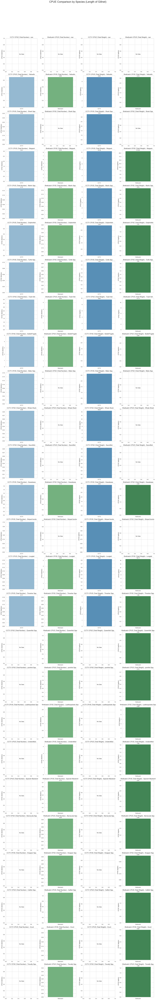

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel file from the specified path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Function to calculate CPUE based on the total length of gillnet used for each species
def calculate_cpue_by_gillnet_length(df, total_catch_column):
    cpue_by_species = df.groupby('Spp.').apply(
        lambda x: x[total_catch_column].sum() / x['Length of Net (km)'].sum() if x['Length of Net (km)'].sum() != 0 else 0
    )
    cpue_by_species = cpue_by_species.reset_index(name='CPUE')
    return cpue_by_species

# Split the dataset into CCTV and Shellcatch
cctv_data = df[df['EMS'] == 'CCTV']
shellcatch_data = df[df['EMS'] == 'Shellcatch']

# Calculate CPUE for each species for CCTV and Shellcatch using Total Number and Total Weight
cctv_cpue_weight = calculate_cpue_by_gillnet_length(cctv_data, 'Total Weight (kg)')
cctv_cpue_number = calculate_cpue_by_gillnet_length(cctv_data, 'Total Number')

shellcatch_cpue_weight = calculate_cpue_by_gillnet_length(shellcatch_data, 'Total Weight (kg)')
shellcatch_cpue_number = calculate_cpue_by_gillnet_length(shellcatch_data, 'Total Number')

# Get the unique species
species_list = df['Spp.'].unique()

# Set the style and color palette for the plots
sns.set(style="whitegrid")
cctv_palette = sns.color_palette("Blues_d")
shellcatch_palette = sns.color_palette("Greens_d")

# Create subplots for each species separately for CCTV and Shellcatch
num_species = len(species_list)
fig, axes = plt.subplots(num_species, 4, figsize=(20, num_species * 5))
fig.suptitle('CPUE Comparison by Species (Length of Gillnet)', fontsize=24)

for i, species in enumerate(species_list):
    # Filter data for the current species
    cctv_species_weight = cctv_cpue_weight[cctv_cpue_weight['Spp.'] == species]
    cctv_species_number = cctv_cpue_number[cctv_cpue_number['Spp.'] == species]
    shellcatch_species_weight = shellcatch_cpue_weight[shellcatch_cpue_weight['Spp.'] == species]
    shellcatch_species_number = shellcatch_cpue_number[shellcatch_cpue_number['Spp.'] == species]
    
    # Plot CCTV Total Number by species
    if not cctv_species_number.empty:
        sns.barplot(ax=axes[i, 0], x=['CCTV'], y=cctv_species_number['CPUE'], palette=[cctv_palette[0]])
        axes[i, 0].set_title(f'CCTV CPUE (Total Number) - {species}', fontsize=14)
        axes[i, 0].set_ylabel('CPUE (fish/km)', fontsize=12)
        axes[i, 0].set_xlabel('')
        for container in axes[i, 0].containers:
            axes[i, 0].bar_label(container, fmt='%.2f', padding=3)
    else:
        axes[i, 0].set_title(f'CCTV CPUE (Total Number) - {species}', fontsize=14)
        axes[i, 0].set_ylabel('CPUE (fish/km)', fontsize=12)
        axes[i, 0].set_xlabel('')
        axes[i, 0].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=12)
    
    # Plot Shellcatch Total Number by species
    if not shellcatch_species_number.empty:
        sns.barplot(ax=axes[i, 1], x=['Shellcatch'], y=shellcatch_species_number['CPUE'], palette=[shellcatch_palette[1]])
        axes[i, 1].set_title(f'Shellcatch CPUE (Total Number) - {species}', fontsize=14)
        axes[i, 1].set_ylabel('CPUE (fish/km)', fontsize=12)
        axes[i, 1].set_xlabel('')
        for container in axes[i, 1].containers:
            axes[i, 1].bar_label(container, fmt='%.2f', padding=3)
    else:
        axes[i, 1].set_title(f'Shellcatch CPUE (Total Number) - {species}', fontsize=14)
        axes[i, 1].set_ylabel('CPUE (fish/km)', fontsize=12)
        axes[i, 1].set_xlabel('')
        axes[i, 1].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=12)
    
    # Plot CCTV Total Weight by species
    if not cctv_species_weight.empty:
        sns.barplot(ax=axes[i, 2], x=['CCTV'], y=cctv_species_weight['CPUE'], palette=[cctv_palette[2]])
        axes[i, 2].set_title(f'CCTV CPUE (Total Weight) - {species}', fontsize=14)
        axes[i, 2].set_ylabel('CPUE (kg/km)', fontsize=12)
        axes[i, 2].set_xlabel('')
        for container in axes[i, 2].containers:
            axes[i, 2].bar_label(container, fmt='%.2f', padding=3)
    else:
        axes[i, 2].set_title(f'CCTV CPUE (Total Weight) - {species}', fontsize=14)
        axes[i, 2].set_ylabel('CPUE (kg/km)', fontsize=12)
        axes[i, 2].set_xlabel('')
        axes[i, 2].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=12)
    
    # Plot Shellcatch Total Weight by species
    if not shellcatch_species_weight.empty:
        sns.barplot(ax=axes[i, 3], x=['Shellcatch'], y=shellcatch_species_weight['CPUE'], palette=[shellcatch_palette[3]])
        axes[i, 3].set_title(f'Shellcatch CPUE (Total Weight) - {species}', fontsize=14)
        axes[i, 3].set_ylabel('CPUE (kg/km)', fontsize=12)
        axes[i, 3].set_xlabel('')
        for container in axes[i, 3].containers:
            axes[i, 3].bar_label(container, fmt='%.2f', padding=3)
    else:
        axes[i, 3].set_title(f'Shellcatch CPUE (Total Weight) - {species}', fontsize=14)
        axes[i, 3].set_ylabel('CPUE (kg/km)', fontsize=12)
        axes[i, 3].set_xlabel('')
        axes[i, 3].text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [ ]:
#compare CPUE across different species

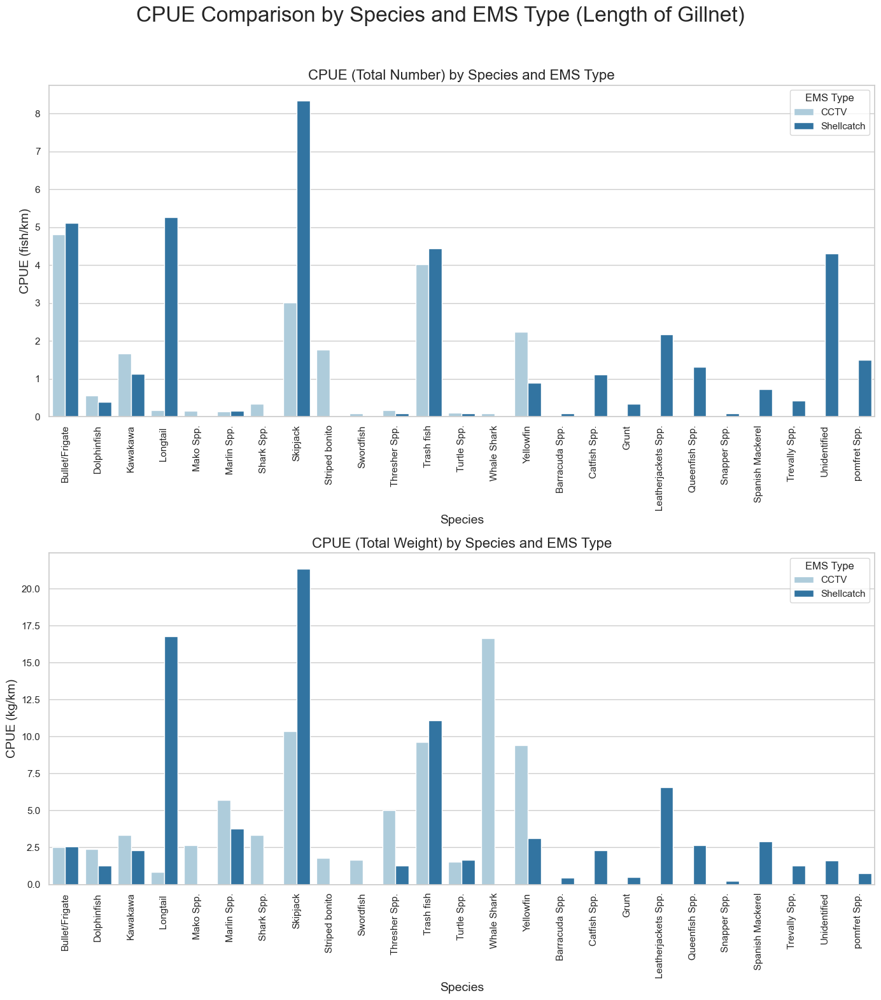

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel file from the specified path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Function to calculate CPUE based on the total length of gillnet used for each species
def calculate_cpue_by_gillnet_length(df, total_catch_column):
    cpue_by_species = df.groupby('Spp.').apply(
        lambda x: x[total_catch_column].sum() / x['Length of Net (km)'].sum() if x['Length of Net (km)'].sum() != 0 else 0
    )
    cpue_by_species = cpue_by_species.reset_index(name='CPUE')
    return cpue_by_species

# Split the dataset into CCTV and Shellcatch
cctv_data = df[df['EMS'] == 'CCTV']
shellcatch_data = df[df['EMS'] == 'Shellcatch']

# Calculate CPUE for each species for CCTV and Shellcatch using Total Number and Total Weight
cctv_cpue_weight = calculate_cpue_by_gillnet_length(cctv_data, 'Total Weight (kg)')
cctv_cpue_number = calculate_cpue_by_gillnet_length(cctv_data, 'Total Number')

shellcatch_cpue_weight = calculate_cpue_by_gillnet_length(shellcatch_data, 'Total Weight (kg)')
shellcatch_cpue_number = calculate_cpue_by_gillnet_length(shellcatch_data, 'Total Number')

# Combine the CPUE data for plotting
combined_cpue_weight = pd.concat([cctv_cpue_weight.assign(EMS='CCTV'), shellcatch_cpue_weight.assign(EMS='Shellcatch')])
combined_cpue_number = pd.concat([cctv_cpue_number.assign(EMS='CCTV'), shellcatch_cpue_number.assign(EMS='Shellcatch')])

# Set the style and color palette for the plots
sns.set(style="whitegrid")
palette = sns.color_palette("Paired")

# Create combined plots for CPUE comparison across different species
fig, axes = plt.subplots(2, 1, figsize=(14, 16))
fig.suptitle('CPUE Comparison by Species and EMS Type (Length of Gillnet)', fontsize=24)

# Plot Total Number CPUE comparison
sns.barplot(ax=axes[0], x='Spp.', y='CPUE', hue='EMS', data=combined_cpue_number, palette=palette)
axes[0].set_title('CPUE (Total Number) by Species and EMS Type', fontsize=16)
axes[0].set_ylabel('CPUE (fish/km)', fontsize=14)
axes[0].set_xlabel('Species', fontsize=14)
axes[0].tick_params(axis='x', rotation=90)
axes[0].legend(title='EMS Type', loc='upper right')

# Plot Total Weight CPUE comparison
sns.barplot(ax=axes[1], x='Spp.', y='CPUE', hue='EMS', data=combined_cpue_weight, palette=palette)
axes[1].set_title('CPUE (Total Weight) by Species and EMS Type', fontsize=16)
axes[1].set_ylabel('CPUE (kg/km)', fontsize=14)
axes[1].set_xlabel('Species', fontsize=14)
axes[1].tick_params(axis='x', rotation=90)
axes[1].legend(title='EMS Type', loc='upper right')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


In [ ]:
# outliers in CPUE data.

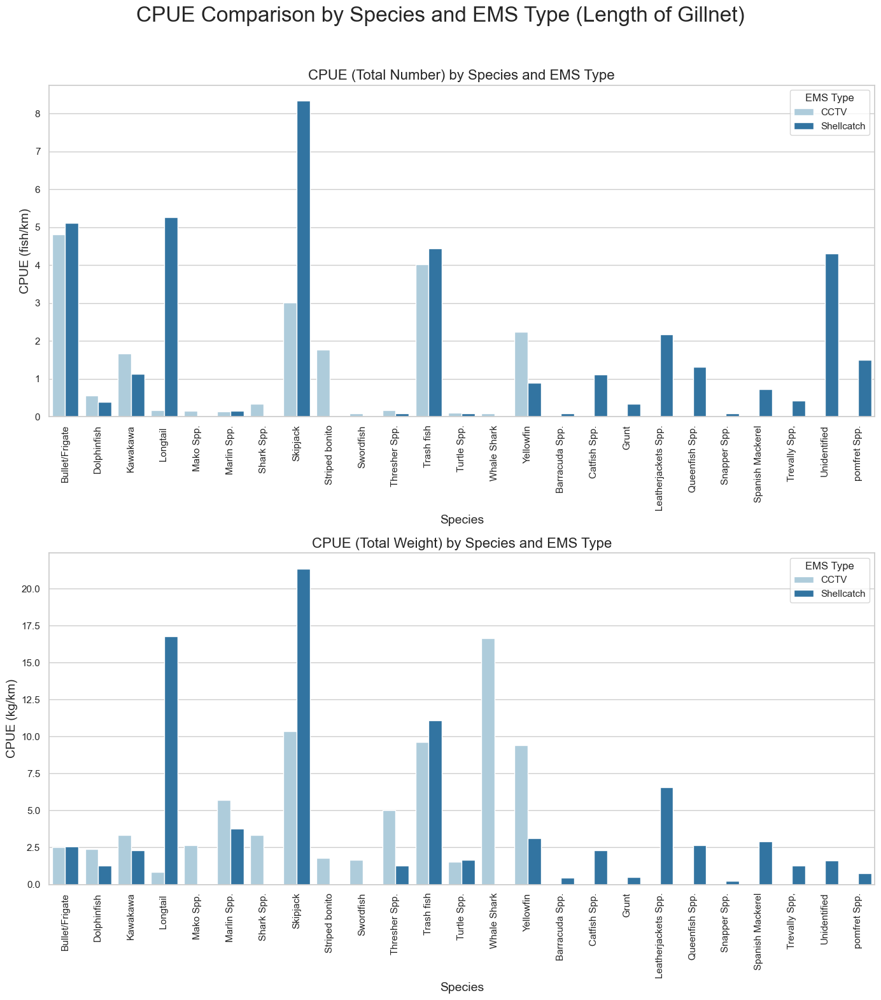

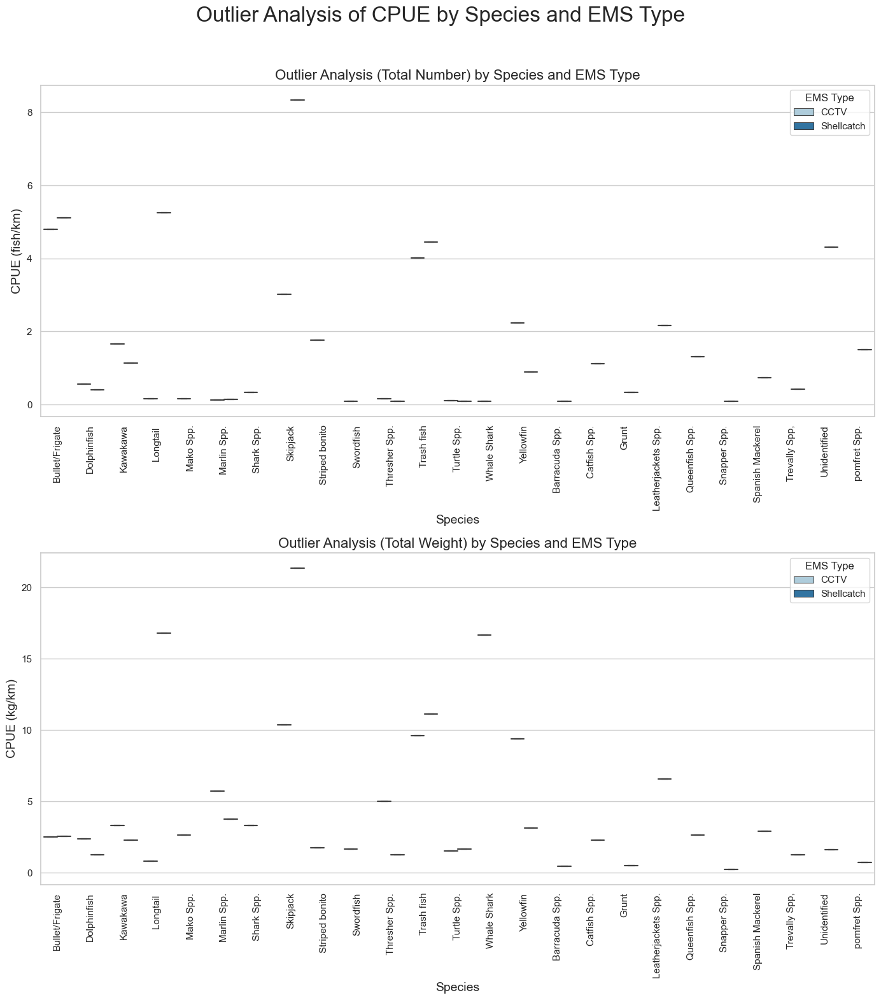

Outliers in CPUE (Total Weight):
           Spp.       CPUE         EMS
13  Whale Shark  16.666667        CCTV
7     Longtail   16.770833  Shellcatch
10     Skipjack  21.354167  Shellcatch
14   Trash fish  11.111111  Shellcatch

Outliers in CPUE (Total Number):
        Spp.      CPUE         EMS
10  Skipjack  8.333333  Shellcatch


In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel file from the specified path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Function to calculate CPUE based on the total length of gillnet used for each species
def calculate_cpue_by_gillnet_length(df, total_catch_column):
    cpue_by_species = df.groupby('Spp.').apply(
        lambda x: x[total_catch_column].sum() / x['Length of Net (km)'].sum() if x['Length of Net (km)'].sum() != 0 else 0
    )
    cpue_by_species = cpue_by_species.reset_index(name='CPUE')
    return cpue_by_species

# Split the dataset into CCTV and Shellcatch
cctv_data = df[df['EMS'] == 'CCTV']
shellcatch_data = df[df['EMS'] == 'Shellcatch']

# Calculate CPUE for each species for CCTV and Shellcatch using Total Number and Total Weight
cctv_cpue_weight = calculate_cpue_by_gillnet_length(cctv_data, 'Total Weight (kg)')
cctv_cpue_number = calculate_cpue_by_gillnet_length(cctv_data, 'Total Number')

shellcatch_cpue_weight = calculate_cpue_by_gillnet_length(shellcatch_data, 'Total Weight (kg)')
shellcatch_cpue_number = calculate_cpue_by_gillnet_length(shellcatch_data, 'Total Number')

# Combine the CPUE data for plotting
combined_cpue_weight = pd.concat([cctv_cpue_weight.assign(EMS='CCTV'), shellcatch_cpue_weight.assign(EMS='Shellcatch')])
combined_cpue_number = pd.concat([cctv_cpue_number.assign(EMS='CCTV'), shellcatch_cpue_number.assign(EMS='Shellcatch')])

# Set the style and color palette for the plots
sns.set(style="whitegrid")
palette = sns.color_palette("Paired")

# Create combined plots for CPUE comparison across different species
fig, axes = plt.subplots(2, 1, figsize=(14, 16))
fig.suptitle('CPUE Comparison by Species and EMS Type (Length of Gillnet)', fontsize=24)

# Plot Total Number CPUE comparison
sns.barplot(ax=axes[0], x='Spp.', y='CPUE', hue='EMS', data=combined_cpue_number, palette=palette)
axes[0].set_title('CPUE (Total Number) by Species and EMS Type', fontsize=16)
axes[0].set_ylabel('CPUE (fish/km)', fontsize=14)
axes[0].set_xlabel('Species', fontsize=14)
axes[0].tick_params(axis='x', rotation=90)
axes[0].legend(title='EMS Type', loc='upper right')

# Plot Total Weight CPUE comparison
sns.barplot(ax=axes[1], x='Spp.', y='CPUE', hue='EMS', data=combined_cpue_weight, palette=palette)
axes[1].set_title('CPUE (Total Weight) by Species and EMS Type', fontsize=16)
axes[1].set_ylabel('CPUE (kg/km)', fontsize=14)
axes[1].set_xlabel('Species', fontsize=14)
axes[1].tick_params(axis='x', rotation=90)
axes[1].legend(title='EMS Type', loc='upper right')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Boxplots for Outlier Analysis
fig, axes = plt.subplots(2, 1, figsize=(14, 16))
fig.suptitle('Outlier Analysis of CPUE by Species and EMS Type', fontsize=24)

# Plot boxplot for Total Number CPUE
sns.boxplot(ax=axes[0], x='Spp.', y='CPUE', hue='EMS', data=combined_cpue_number, palette=palette)
axes[0].set_title('Outlier Analysis (Total Number) by Species and EMS Type', fontsize=16)
axes[0].set_ylabel('CPUE (fish/km)', fontsize=14)
axes[0].set_xlabel('Species', fontsize=14)
axes[0].tick_params(axis='x', rotation=90)
axes[0].legend(title='EMS Type', loc='upper right')

# Plot boxplot for Total Weight CPUE
sns.boxplot(ax=axes[1], x='Spp.', y='CPUE', hue='EMS', data=combined_cpue_weight, palette=palette)
axes[1].set_title('Outlier Analysis (Total Weight) by Species and EMS Type', fontsize=16)
axes[1].set_ylabel('CPUE (kg/km)', fontsize=14)
axes[1].set_xlabel('Species', fontsize=14)
axes[1].tick_params(axis='x', rotation=90)
axes[1].legend(title='EMS Type', loc='upper right')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Identify outliers using IQR
def identify_outliers(df):
    Q1 = df['CPUE'].quantile(0.25)
    Q3 = df['CPUE'].quantile(0.75)
    IQR = Q3 - Q1
    outliers = df[(df['CPUE'] < Q1 - 1.5 * IQR) | (df['CPUE'] > Q3 + 1.5 * IQR)]
    return outliers

# Identify outliers in the combined CPUE data
outliers_weight = identify_outliers(combined_cpue_weight)
outliers_number = identify_outliers(combined_cpue_number)

print("Outliers in CPUE (Total Weight):")
print(outliers_weight)

print("\nOutliers in CPUE (Total Number):")
print(outliers_number)


In [ ]:
# Investigate species-specific CPUE variability

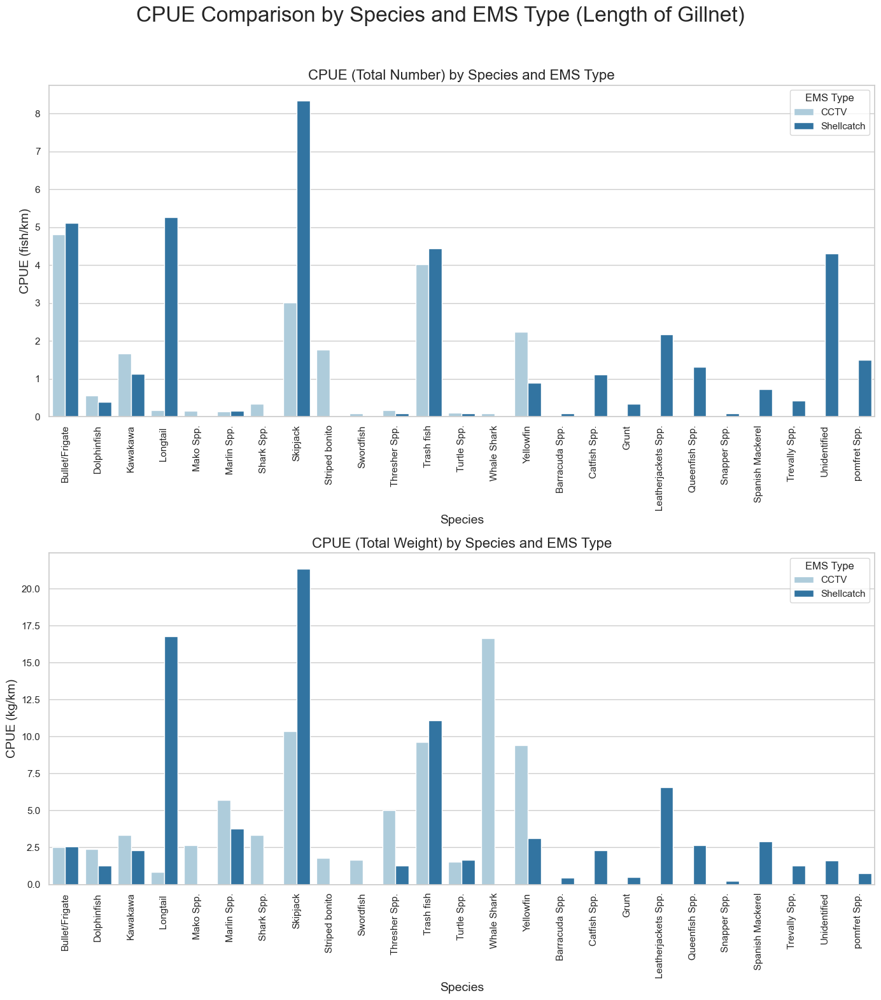

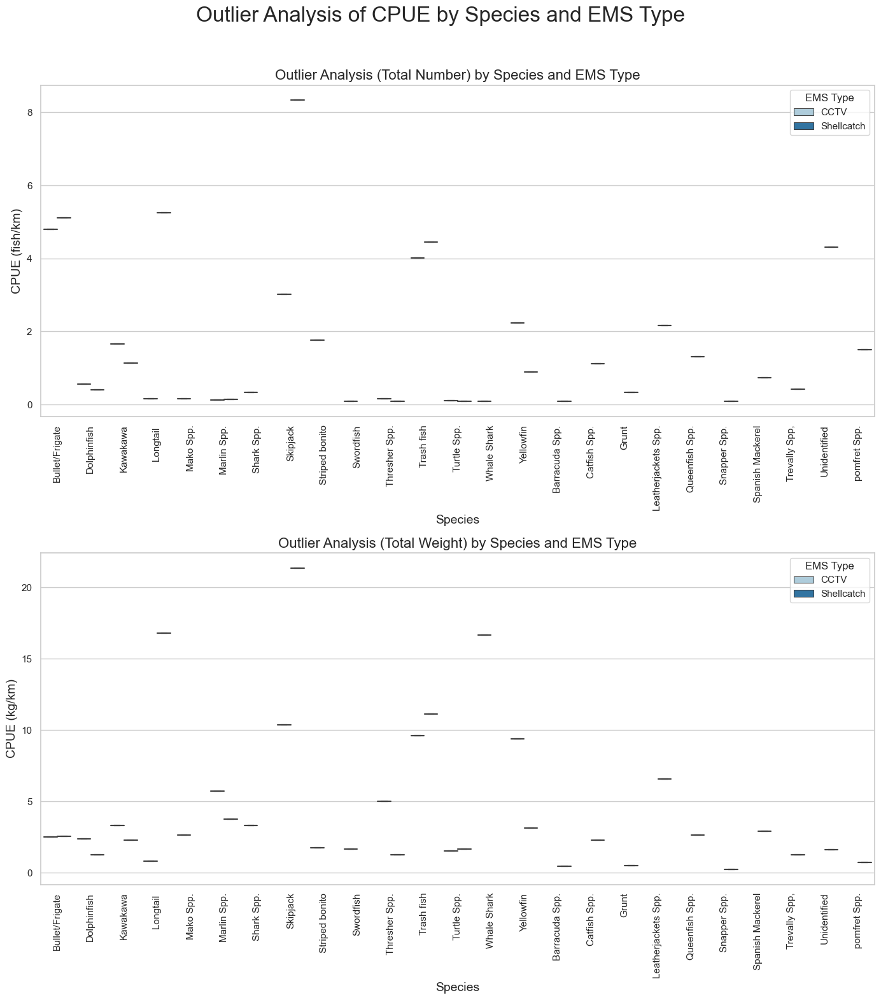

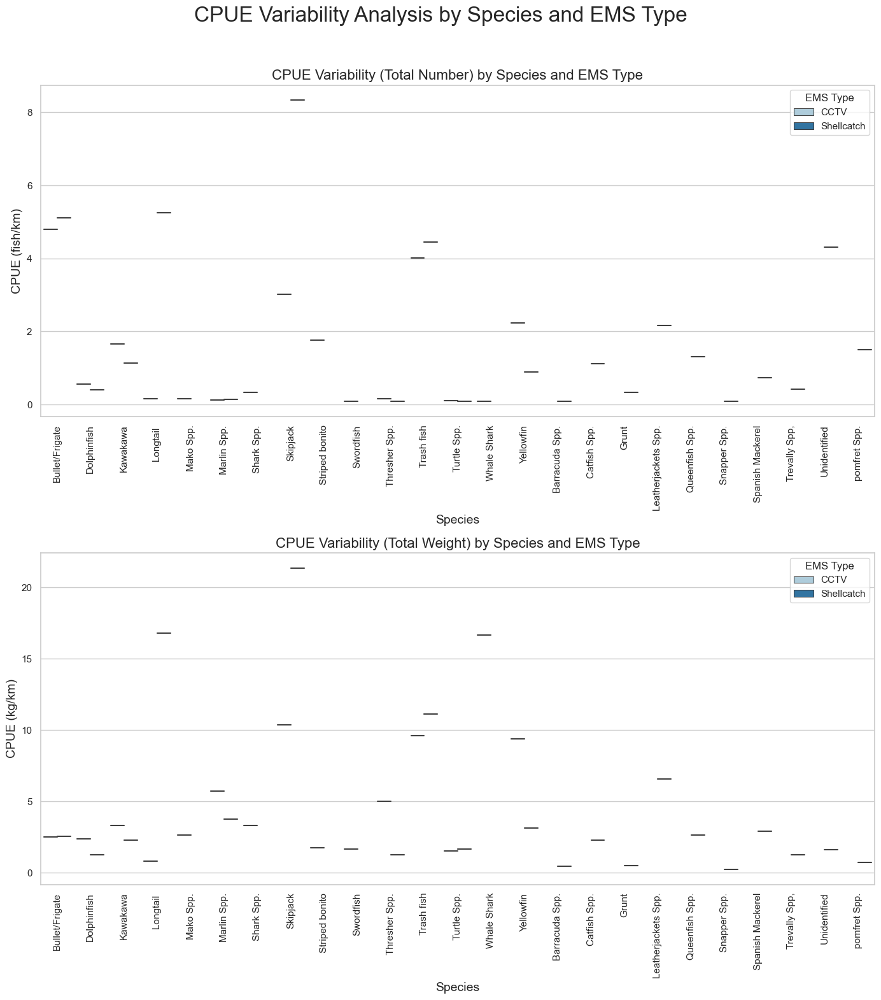

Descriptive Statistics for CPUE (Total Weight):
                                count       mean  std        min        25%  \
Spp.                EMS                                                       
Barracuda Spp.      Shellcatch    1.0   0.444444  NaN   0.444444   0.444444   
Bullet/Frigate      CCTV          1.0   2.518116  NaN   2.518116   2.518116   
                    Shellcatch    1.0   2.552083  NaN   2.552083   2.552083   
Catfish Spp.        Shellcatch    1.0   2.300000  NaN   2.300000   2.300000   
Dolphinfish         CCTV          1.0   2.380952  NaN   2.380952   2.380952   
                    Shellcatch    1.0   1.270833  NaN   1.270833   1.270833   
Grunt               Shellcatch    1.0   0.500000  NaN   0.500000   0.500000   
Kawakawa            CCTV          1.0   3.333333  NaN   3.333333   3.333333   
                    Shellcatch    1.0   2.316667  NaN   2.316667   2.316667   
Leatherjackets Spp. Shellcatch    1.0   6.583333  NaN   6.583333   6.583333   
Long

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the Excel file from the specified path
file_path = r'D:\Shellcatch_Trials\EMS_CCTV_EMS_Data_Analysis\Paper\EMS_June_2024.xlsx'
df = pd.read_excel(file_path, sheet_name='Sheet1')

# Function to calculate CPUE based on the total length of gillnet used for each species
def calculate_cpue_by_gillnet_length(df, total_catch_column):
    cpue_by_species = df.groupby('Spp.').apply(
        lambda x: x[total_catch_column].sum() / x['Length of Net (km)'].sum() if x['Length of Net (km)'].sum() != 0 else 0
    )
    cpue_by_species = cpue_by_species.reset_index(name='CPUE')
    return cpue_by_species

# Split the dataset into CCTV and Shellcatch
cctv_data = df[df['EMS'] == 'CCTV']
shellcatch_data = df[df['EMS'] == 'Shellcatch']

# Calculate CPUE for each species for CCTV and Shellcatch using Total Number and Total Weight
cctv_cpue_weight = calculate_cpue_by_gillnet_length(cctv_data, 'Total Weight (kg)')
cctv_cpue_number = calculate_cpue_by_gillnet_length(cctv_data, 'Total Number')

shellcatch_cpue_weight = calculate_cpue_by_gillnet_length(shellcatch_data, 'Total Weight (kg)')
shellcatch_cpue_number = calculate_cpue_by_gillnet_length(shellcatch_data, 'Total Number')

# Combine the CPUE data for plotting
combined_cpue_weight = pd.concat([cctv_cpue_weight.assign(EMS='CCTV'), shellcatch_cpue_weight.assign(EMS='Shellcatch')])
combined_cpue_number = pd.concat([cctv_cpue_number.assign(EMS='CCTV'), shellcatch_cpue_number.assign(EMS='Shellcatch')])

# Set the style and color palette for the plots
sns.set(style="whitegrid")
palette = sns.color_palette("Paired")

# Create combined plots for CPUE comparison across different species
fig, axes = plt.subplots(2, 1, figsize=(14, 16))
fig.suptitle('CPUE Comparison by Species and EMS Type (Length of Gillnet)', fontsize=24)

# Plot Total Number CPUE comparison
sns.barplot(ax=axes[0], x='Spp.', y='CPUE', hue='EMS', data=combined_cpue_number, palette=palette)
axes[0].set_title('CPUE (Total Number) by Species and EMS Type', fontsize=16)
axes[0].set_ylabel('CPUE (fish/km)', fontsize=14)
axes[0].set_xlabel('Species', fontsize=14)
axes[0].tick_params(axis='x', rotation=90)
axes[0].legend(title='EMS Type', loc='upper right')

# Plot Total Weight CPUE comparison
sns.barplot(ax=axes[1], x='Spp.', y='CPUE', hue='EMS', data=combined_cpue_weight, palette=palette)
axes[1].set_title('CPUE (Total Weight) by Species and EMS Type', fontsize=16)
axes[1].set_ylabel('CPUE (kg/km)', fontsize=14)
axes[1].set_xlabel('Species', fontsize=14)
axes[1].tick_params(axis='x', rotation=90)
axes[1].legend(title='EMS Type', loc='upper right')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Boxplots for Outlier Analysis
fig, axes = plt.subplots(2, 1, figsize=(14, 16))
fig.suptitle('Outlier Analysis of CPUE by Species and EMS Type', fontsize=24)

# Plot boxplot for Total Number CPUE
sns.boxplot(ax=axes[0], x='Spp.', y='CPUE', hue='EMS', data=combined_cpue_number, palette=palette)
axes[0].set_title('Outlier Analysis (Total Number) by Species and EMS Type', fontsize=16)
axes[0].set_ylabel('CPUE (fish/km)', fontsize=14)
axes[0].set_xlabel('Species', fontsize=14)
axes[0].tick_params(axis='x', rotation=90)
axes[0].legend(title='EMS Type', loc='upper right')

# Plot boxplot for Total Weight CPUE
sns.boxplot(ax=axes[1], x='Spp.', y='CPUE', hue='EMS', data=combined_cpue_weight, palette=palette)
axes[1].set_title('Outlier Analysis (Total Weight) by Species and EMS Type', fontsize=16)
axes[1].set_ylabel('CPUE (kg/km)', fontsize=14)
axes[1].set_xlabel('Species', fontsize=14)
axes[1].tick_params(axis='x', rotation=90)
axes[1].legend(title='EMS Type', loc='upper right')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Violin plots for CPUE variability analysis
fig, axes = plt.subplots(2, 1, figsize=(14, 16))
fig.suptitle('CPUE Variability Analysis by Species and EMS Type', fontsize=24)

# Plot violin plot for Total Number CPUE
sns.violinplot(ax=axes[0], x='Spp.', y='CPUE', hue='EMS', data=combined_cpue_number, split=True, palette=palette)
axes[0].set_title('CPUE Variability (Total Number) by Species and EMS Type', fontsize=16)
axes[0].set_ylabel('CPUE (fish/km)', fontsize=14)
axes[0].set_xlabel('Species', fontsize=14)
axes[0].tick_params(axis='x', rotation=90)
axes[0].legend(title='EMS Type', loc='upper right')

# Plot violin plot for Total Weight CPUE
sns.violinplot(ax=axes[1], x='Spp.', y='CPUE', hue='EMS', data=combined_cpue_weight, split=True, palette=palette)
axes[1].set_title('CPUE Variability (Total Weight) by Species and EMS Type', fontsize=16)
axes[1].set_ylabel('CPUE (kg/km)', fontsize=14)
axes[1].set_xlabel('Species', fontsize=14)
axes[1].tick_params(axis='x', rotation=90)
axes[1].legend(title='EMS Type', loc='upper right')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Calculate descriptive statistics for CPUE variability analysis
def cpue_descriptive_stats(df):
    stats = df.groupby(['Spp.', 'EMS'])['CPUE'].describe()
    return stats

# Calculate descriptive statistics for combined CPUE data
stats_weight = cpue_descriptive_stats(combined_cpue_weight)
stats_number = cpue_descriptive_stats(combined_cpue_number)

print("Descriptive Statistics for CPUE (Total Weight):")
print(stats_weight)

print("\nDescriptive Statistics for CPUE (Total Number):")
print(stats_number)
